# Import Libraries

In [405]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import OneHotEncoder, LabelEncoder, StandardScaler, MinMaxScaler
from sklearn.model_selection import train_test_split, GridSearchCV, RandomizedSearchCV, cross_val_score, KFold
from sklearn.feature_selection import SelectKBest, f_regression, mutual_info_regression, RFECV
from sklearn.impute import SimpleImputer, KNNImputer
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error
from sklearn.linear_model import LinearRegression, Ridge, Lasso, ElasticNet
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor, VotingRegressor, StackingRegressor
from sklearn.svm import SVR
from sklearn.neighbors import KNeighborsRegressor
from xgboost import XGBRegressor
from lightgbm import LGBMRegressor
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.cluster import KMeans
import hdbscan
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.decomposition import PCA
import nltk
from nltk.sentiment import SentimentIntensityAnalyzer
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from nltk.stem import WordNetLemmatizer
import string
import re
from datetime import datetime
import time
import folium
from folium.plugins import MarkerCluster
import random
import swifter
from joblib import Parallel, delayed
from tqdm import tqdm
from tqdm_joblib import tqdm_joblib

import pickle


# Download NLTK resources
nltk.download('vader_lexicon', quiet=True)
nltk.download('punkt', quiet=True)
nltk.download('stopwords', quiet=True)
nltk.download('wordnet', quiet=True)

# Set random seed for reproducibility
RANDOM_STATE = 42
np.random.seed(RANDOM_STATE)

# Function for better display of dataframes in notebook
def display_df(df, rows=5):
    return df.head(rows)


# Loading dataset

In [406]:
df = pd.read_csv(r'D:\fcis\machine\project\train_data_reg.csv')
print(f"Dataset shape: {df.shape}")

Dataset shape: (6724, 69)


# Divide Columns

In [407]:
# Define column groups based on data type and content
id_cols = ['id', 'host_id']
url_cols = ['listing_url', 'host_url', 'thumbnail_url']
text_cols = ['name', 'summary', 'space', 'description', 'neighborhood_overview',
             'notes', 'transit', 'access', 'interaction', 'house_rules', 'host_about']
date_cols = ['host_since', 'first_review', 'last_review']
price_cols = ['nightly_price', 'price_per_stay', 'security_deposit', 'cleaning_fee', 'extra_people']
binary_cols = ['host_is_superhost', 'host_has_profile_pic', 'host_identity_verified', 'is_location_exact',
               'requires_license', 'instant_bookable', 'is_business_travel_ready',
               'require_guest_profile_picture', 'require_guest_phone_verification']
location_cols = ['neighbourhood', 'neighbourhood_cleansed', 'city', 'state', 'zipcode', 'market',
                'smart_location', 'country_code', 'country', 'street', 'latitude', 'longitude']
property_cols = ['property_type', 'room_type', 'accommodates', 'bathrooms',
                'bedrooms', 'beds', 'bed_type', 'square_feet']
host_cols = ['host_name', 'host_location', 'host_response_time', 'host_response_rate',
            'host_acceptance_rate', 'host_neighbourhood', 'host_listings_count', 'host_total_listings_count']
booking_cols = ['guests_included', 'minimum_nights', 'maximum_nights', 'number_of_reviews',
               'number_of_stays', 'cancellation_policy']

# Target column
target_col = 'review_scores_rating'


# info of Data

In [408]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6724 entries, 0 to 6723
Data columns (total 69 columns):
 #   Column                            Non-Null Count  Dtype  
---  ------                            --------------  -----  
 0   id                                6724 non-null   int64  
 1   listing_url                       6724 non-null   object 
 2   name                              6724 non-null   object 
 3   summary                           6551 non-null   object 
 4   space                             5503 non-null   object 
 5   description                       6644 non-null   object 
 6   neighborhood_overview             4966 non-null   object 
 7   notes                             4018 non-null   object 
 8   transit                           4595 non-null   object 
 9   access                            4610 non-null   object 
 10  interaction                       4747 non-null   object 
 11  house_rules                       5202 non-null   object 
 12  thumbn

In [409]:
df.shape

(6724, 69)

In [410]:
df.columns

Index(['id', 'listing_url', 'name', 'summary', 'space', 'description',
       'neighborhood_overview', 'notes', 'transit', 'access', 'interaction',
       'house_rules', 'thumbnail_url', 'host_id', 'host_url', 'host_name',
       'host_since', 'host_location', 'host_about', 'host_response_time',
       'host_response_rate', 'host_acceptance_rate', 'host_is_superhost',
       'host_neighbourhood', 'host_listings_count',
       'host_total_listings_count', 'host_has_profile_pic',
       'host_identity_verified', 'street', 'neighbourhood',
       'neighbourhood_cleansed', 'city', 'state', 'zipcode', 'market',
       'smart_location', 'country_code', 'country', 'latitude', 'longitude',
       'is_location_exact', 'property_type', 'room_type', 'accommodates',
       'bathrooms', 'bedrooms', 'beds', 'bed_type', 'amenities', 'square_feet',
       'nightly_price', 'price_per_stay', 'security_deposit', 'cleaning_fee',
       'guests_included', 'extra_people', 'minimum_nights', 'maximum_nights',

In [411]:
df.head()

,id,listing_url,name,summary,space,description,neighborhood_overview,notes,transit,access,...,number_of_stays,first_review,last_review,review_scores_rating,requires_license,instant_bookable,is_business_travel_ready,cancellation_policy,require_guest_profile_picture,require_guest_phone_verification
0,37466870,https://www.airbnb.com/rooms/37466870,Charming & Bright La Jolla Shores Beach Retreat,Experience coastal living in this bright & air...,NaN,Experience coastal living in this bright & air...,"You're truly in the center of it all, La Jolla...",NaN,NaN,NaN,...,2,8/17/2019,8/17/2019,100.0,f,f,f,strict_14_with_grace_period,f,f
1,15252776,https://www.airbnb.com/rooms/15252776,Exclusive Ground Fl. Patio★1 Home to Ocean★Pet...,South Shore 1 is a pet-friendly 3 bedroom + 2 ...,REMODEL FINISHES Our goal with our new remodel...,South Shore 1 is a pet-friendly 3 bedroom + 2 ...,Our home is ideally located in highly desirabl...,"Please remember that you’re staying in a home,...",NaN,Door code is provided 2 days prior to checkin,...,12,11/20/2016,1/6/2019,92.0,f,f,f,strict_14_with_grace_period,t,t
2,34570520,https://www.airbnb.com/rooms/34570520,Downtown/Gaslamp Walk To Conventions Free/Park...,Staying in this artistic masterpiece is truly ...,Watch TV from the king size tempur-pedic cloud...,Staying in this artistic masterpiece is truly ...,"Padres Stadium, Basic Pizza, Fit Athletic, Sta...",We always ask to Please be respectful of neigh...,"Condo is a block away from Padres Petco Park, ...",Entire place,...,4,6/23/2019,7/8/2019,100.0,f,t,f,strict_14_with_grace_period,f,f
3,8813329,https://www.airbnb.com/rooms/8813329,LUXURY Master Suite near San Diego SAFARI Park,Unique & Royal Feeling-OVER SIZED SUITE- BATH-...,Over sized Royal suite perfect for4 people in...,Unique & Royal Feeling-OVER SIZED SUITE- BATH-...,Country side but close to all,"For the welfare of our guests, our home is Smo...","Very close (3.5 miles) to freeway 15, 3 miles ...",Kitchen is for host's use only.,...,172,6/25/2017,8/13/2019,100.0,f,f,f,moderate,f,f
4,23142661,https://www.airbnb.com/rooms/23142661,Gorgeous Condominium in Downtown San Diego,Thanksgiving and Christmas Holiday Special / C...,"FURNISHED one bedroom, one-bathroom condo in t...",Thanksgiving and Christmas Holiday Special / C...,"Many fine dining establishments, bars, clubs, ...",This is a non-smoking suite. Smoking is NOT al...,Walking distance to many fine dining establish...,The entire condo suite.,...,6,6/15/2018,7/6/2019,100.0,f,t,f,strict_14_with_grace_period,f,f


# Check Data "Nulls , Duplication"

In [412]:
df.isnull().sum()

id                                     0
listing_url                            0
name                                   0
summary                              173
space                               1221
                                    ... 
instant_bookable                       0
is_business_travel_ready               0
cancellation_policy                    0
require_guest_profile_picture          0
require_guest_phone_verification       0
Length: 69, dtype: int64


Columns with high missing values:
thumbnail_url           100.000000
host_acceptance_rate    100.000000
square_feet              98.839976
notes                    40.243902
dtype: float64


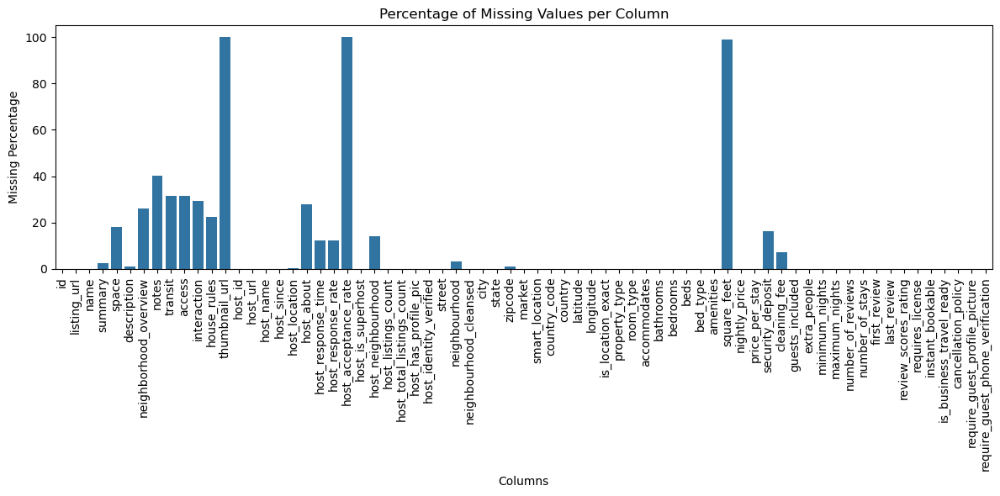

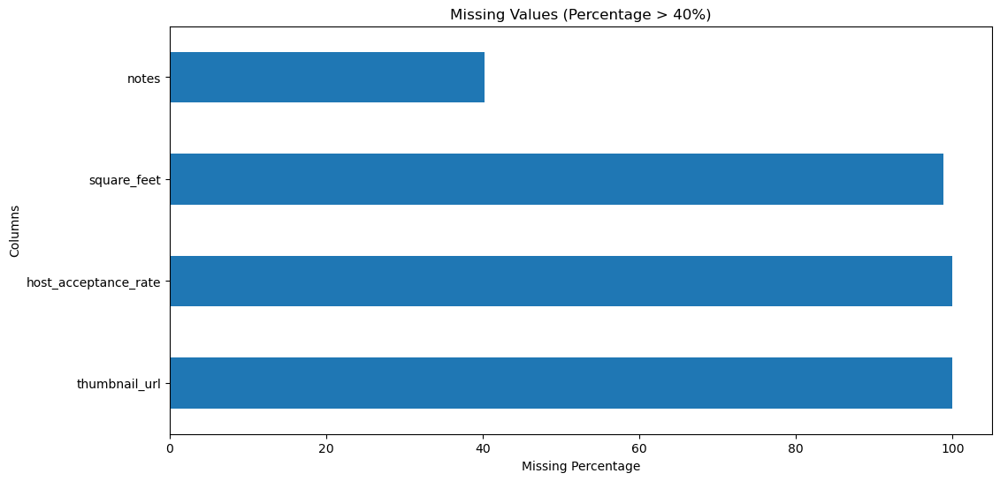

In [413]:
missing_percent = (df.isnull().sum() / len(df)) * 100
print("\nColumns with high missing values:")
print(missing_percent[missing_percent > 40].sort_values(ascending=False))

# Generate a bar plot of missing values
plt.figure(figsize=(12, 6))
sns.barplot(x=missing_percent.index, y=missing_percent.values)
plt.xticks(rotation=90)
plt.xlabel("Columns")
plt.ylabel("Missing Percentage")
plt.title("Percentage of Missing Values per Column")
plt.tight_layout()
plt.show()

# Generate a horizontal bar plot of missing values (for better readability if many columns)
plt.figure(figsize=(12, 6))
missing_percent[missing_percent > 40].sort_values(ascending=False).plot(kind='barh')
plt.xlabel("Missing Percentage")
plt.ylabel("Columns")
plt.title("Missing Values (Percentage > 40%)")
plt.show()


In [414]:
import plotly.express as px

# Calculate missing percentage
missing_percent = (df.isnull().sum() / len(df)) * 100
print("\nColumns with high missing values:")
print(missing_percent[missing_percent > 40].sort_values(ascending=False))

# Interactive bar plot of missing values using plotly
fig = px.bar(
    x=missing_percent.index,
    y=missing_percent.values,
    labels={'x': 'Columns', 'y': 'Missing Percentage'},
    title='Percentage of Missing Values per Column',
    template='plotly_dark'
)

fig.update_layout(
    xaxis_title="Columns",
    yaxis_title="Missing Percentage",
    xaxis_tickangle=-45,
    showlegend=False
)

fig.show()

# Interactive horizontal bar plot of missing values (for better readability if many columns)
fig2 = px.bar(
    missing_percent[missing_percent > 40].sort_values(ascending=False),
    orientation='h',
    labels={'value': 'Missing Percentage', 'index': 'Columns'},
    title='Missing Values (Percentage > 40%)',
    template='plotly_dark'
)

fig2.update_layout(
    xaxis_title="Missing Percentage",
    yaxis_title="Columns",
    showlegend=False
)

fig2.show()



Columns with high missing values:
thumbnail_url           100.000000
host_acceptance_rate    100.000000
square_feet              98.839976
notes                    40.243902
dtype: float64


In [415]:
drop_cols = ['host_acceptance_rate', 'square_feet']
df = df.drop(drop_cols, axis=1)

In [416]:
duplicate_count = df.duplicated().sum()
if duplicate_count > 0:
    df = df.drop_duplicates()
    print(f"Duplicates dropped. New shape: {df.shape}")


# Check Columns

In [417]:
df[['host_listings_count','host_total_listings_count']].head()

,host_listings_count,host_total_listings_count
0,0.0,0.0
1,69.0,69.0
2,1.0,1.0
3,5.0,5.0
4,3.0,3.0


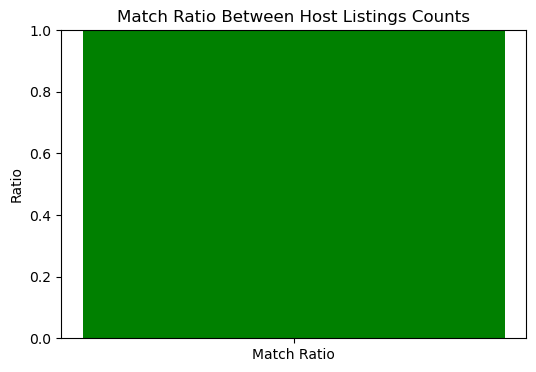

In [418]:
import matplotlib.pyplot as plt

# Calculate the match ratio
match_ratio = (df['host_listings_count'] == df['host_total_listings_count']).mean()

# Plotting
plt.figure(figsize=(6, 4))
plt.bar(['Match Ratio'], [match_ratio], color='green')
plt.ylim(0, 1)
plt.title('Match Ratio Between Host Listings Counts')
plt.ylabel('Ratio')
plt.show()


In [419]:
df.drop(['host_listings_count'], axis=1, inplace=True)

# Convert Object to Number

In [420]:
price_columns = ['nightly_price', 'price_per_stay', 'security_deposit', 'cleaning_fee', 'extra_people']
for col in price_columns:
    if df[col].dtype == 'object':
        df[col] = df[col].replace('[\$,]', '', regex=True).astype(float)

# 3. Convert percentage string to float
if 'host_response_rate' in df.columns and df['host_response_rate'].dtype == 'object':
    df['host_response_rate'] = df['host_response_rate'].str.replace('%', '').astype(float) / 100


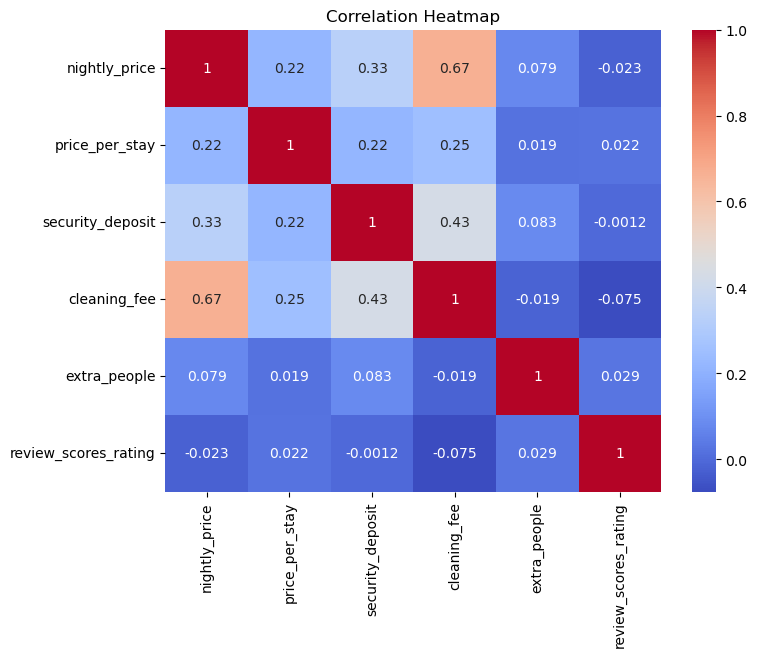

In [421]:
price_corr = df[price_columns + ['review_scores_rating']].corr()
plt.figure(figsize=(8, 6))
sns.heatmap(price_corr, annot=True, cmap='coolwarm')
plt.title("Correlation Heatmap")
plt.show()


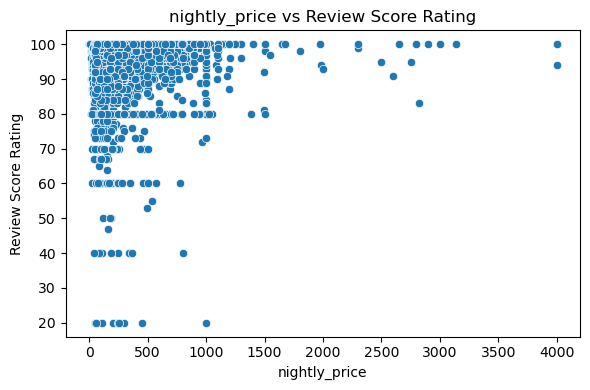

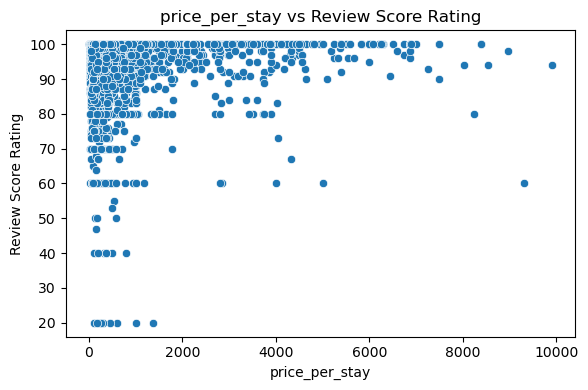

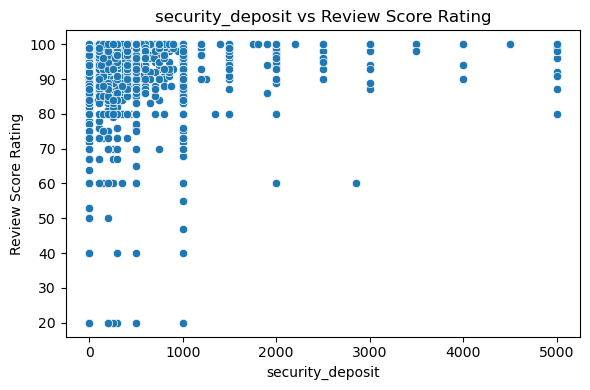

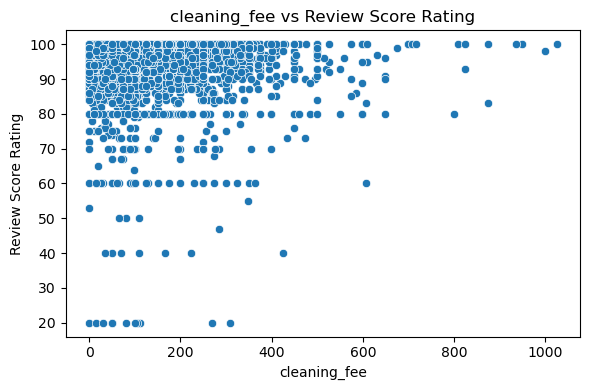

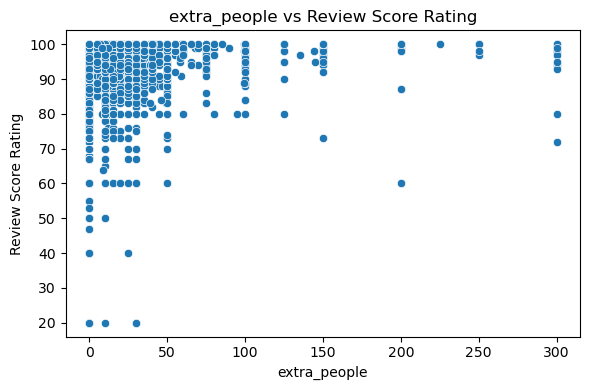

In [422]:
for col in price_columns:
    plt.figure(figsize=(6, 4))
    sns.scatterplot(x=df[col], y=df['review_scores_rating'])
    plt.title(f'{col} vs Review Score Rating')
    plt.xlabel(col)
    plt.ylabel('Review Score Rating')
    plt.tight_layout()
    plt.show()


In [423]:
df.drop("thumbnail_url", axis = 1, inplace = True)

# Handle Missing Values

In [424]:
from sklearn.preprocessing import StandardScaler
from sklearn.impute import KNNImputer
import pandas as pd

# Get all numeric columns
num_cols = df.select_dtypes(include=['int64', 'float64']).columns
x = pd.DataFrame(num_cols, columns=['Numeric Columns'])
print(x.info() )
# Create a scaler for all numeric columns
scaler = StandardScaler()
scaled_data = scaler.fit_transform(df[num_cols])

imputer = KNNImputer(n_neighbors=5)
imputed_data = imputer.fit_transform(scaled_data)

df[num_cols] = pd.DataFrame(scaler.inverse_transform(imputed_data), columns=num_cols, index=df.index)
print(len(num_cols))


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21 entries, 0 to 20
Data columns (total 1 columns):
 #   Column           Non-Null Count  Dtype 
---  ------           --------------  ----- 
 0   Numeric Columns  21 non-null     object
dtypes: object(1)
memory usage: 300.0+ bytes
None
21


In [425]:
#save scaler and imputer -1

with open('reg_scalerModel.pkl', 'wb') as file:
    pickle.dump(scaler, file)

with open('reg_imputerModel.pkl', 'wb') as file:
    pickle.dump(imputer, file)

In [426]:
text_cols = ['name', 'summary', 'space', 'description', 'neighborhood_overview',
             'notes', 'transit', 'access', 'interaction', 'house_rules', 'host_about']
text_null_percentages = df[text_cols].isnull().sum() / len(df) * 100
print(text_null_percentages)


name                      0.000000
summary                   2.572873
space                    18.158834
description               1.189768
neighborhood_overview    26.145152
notes                    40.243902
transit                  31.662701
access                   31.439619
interaction              29.402142
house_rules              22.635336
host_about               27.914932
dtype: float64


In [427]:
# df[text_cols] = df[text_cols].fillna("")


In [428]:
# For categorical columns
cat_cols = df.select_dtypes(include=['object']).columns
print(len(cat_cols))
modesForPickle={}
for col in cat_cols:
        mode_val = df[col].mode()[0]
        df[col] = df[col].fillna(mode_val)
        modesForPickle[col] = mode_val
        
with open('modesToReplaceNulls_reg.pkl', 'wb') as file:
    pickle.dump(modesForPickle, file)

44


# HeatMap

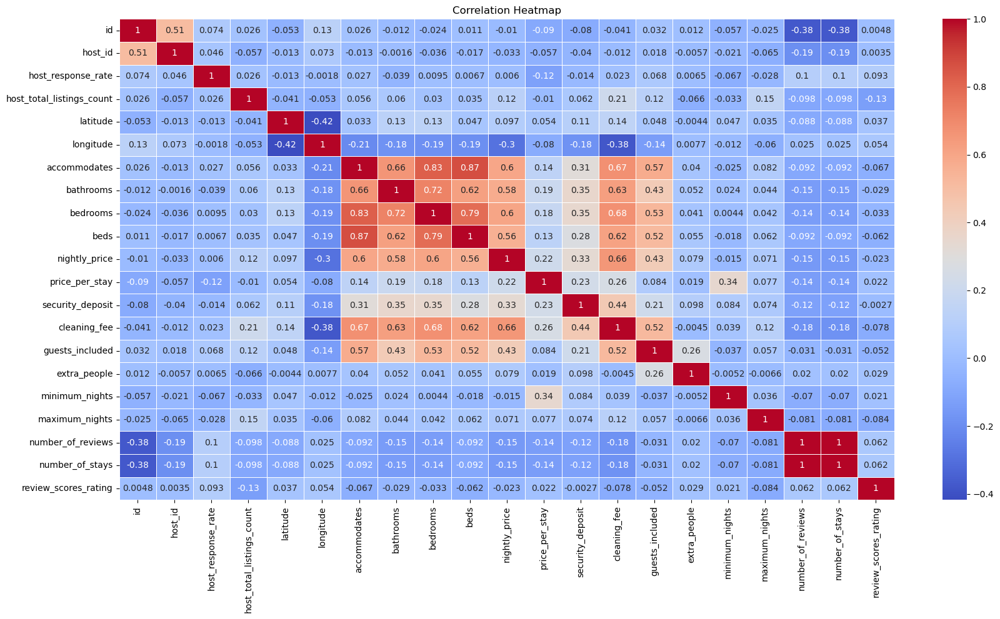

In [429]:
# Compute correlation matrix
corr_matrix = df[num_cols].corr() # Change: Select the data in df using num_cols

# Plot heatmap
plt.figure(figsize=(20,10))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', linewidths=.5)
plt.title('Correlation Heatmap')
plt.show()

# Visualization

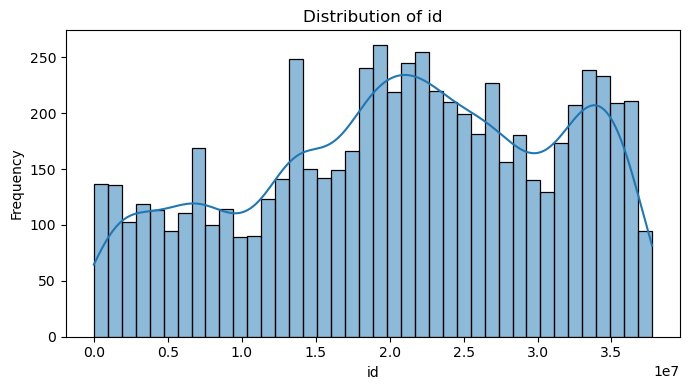

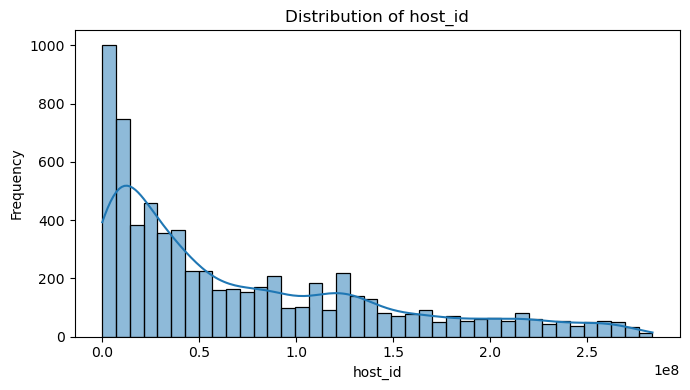

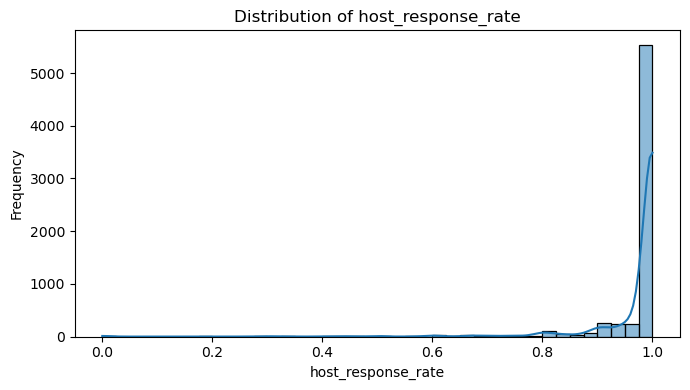

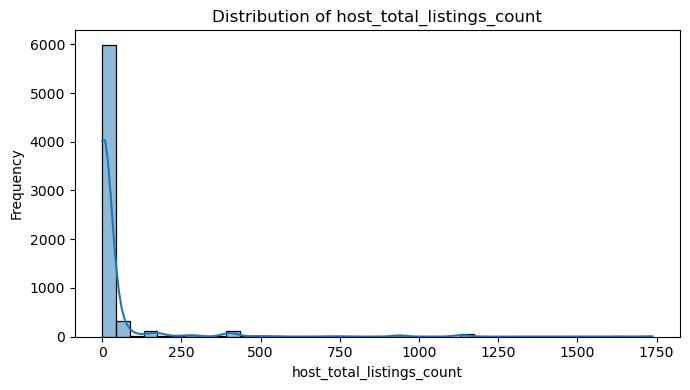

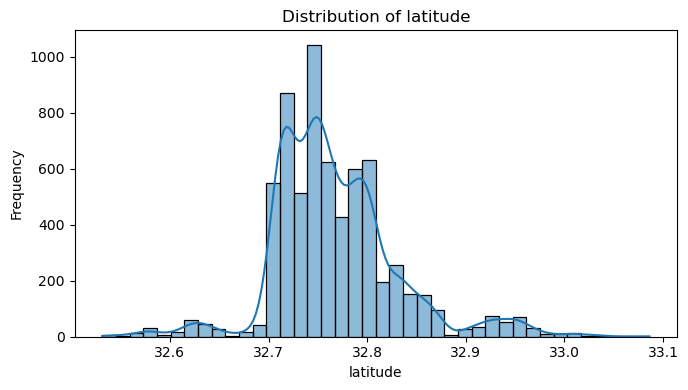

...

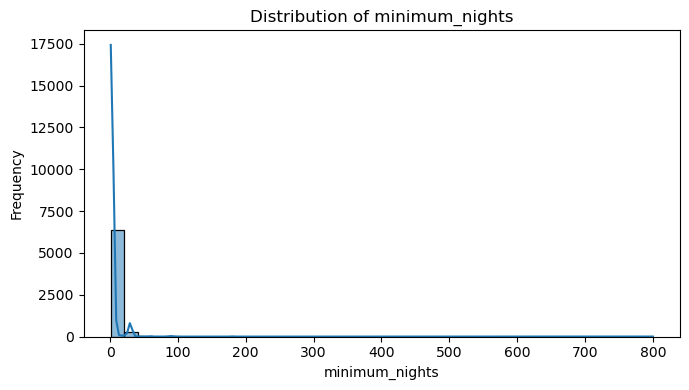

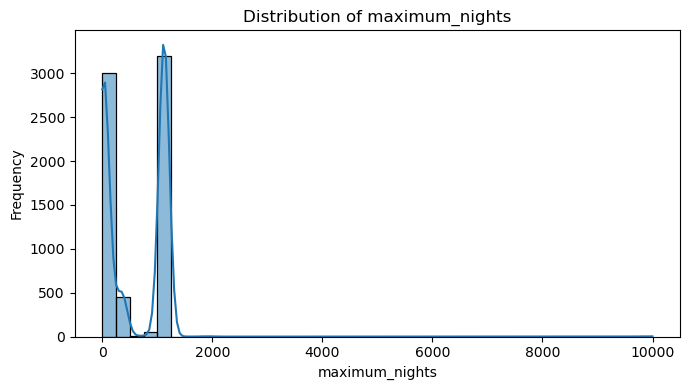

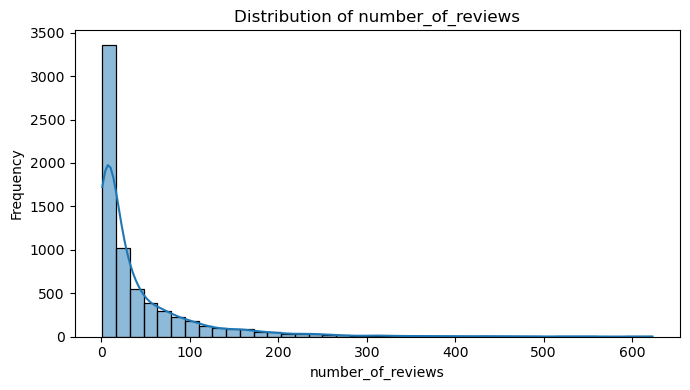

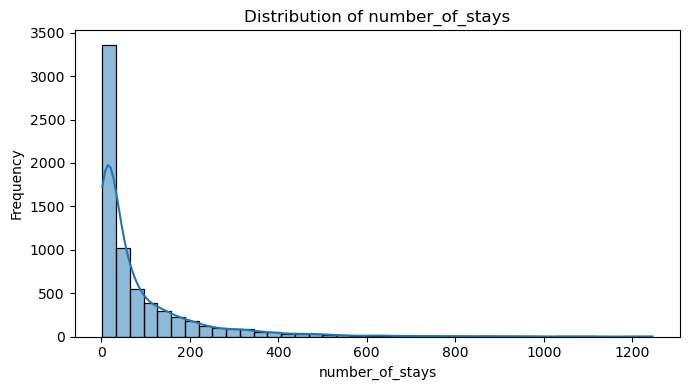

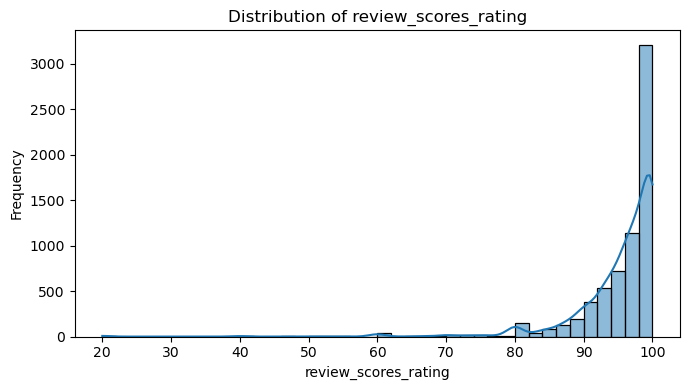

In [430]:
for col in num_cols:
    plt.figure(figsize=(7, 4))
    sns.histplot(df[col], kde=True, bins=40)
    plt.title(f'Distribution of {col}')
    plt.xlabel(col)
    plt.ylabel('Frequency')
    plt.tight_layout()
    plt.show()


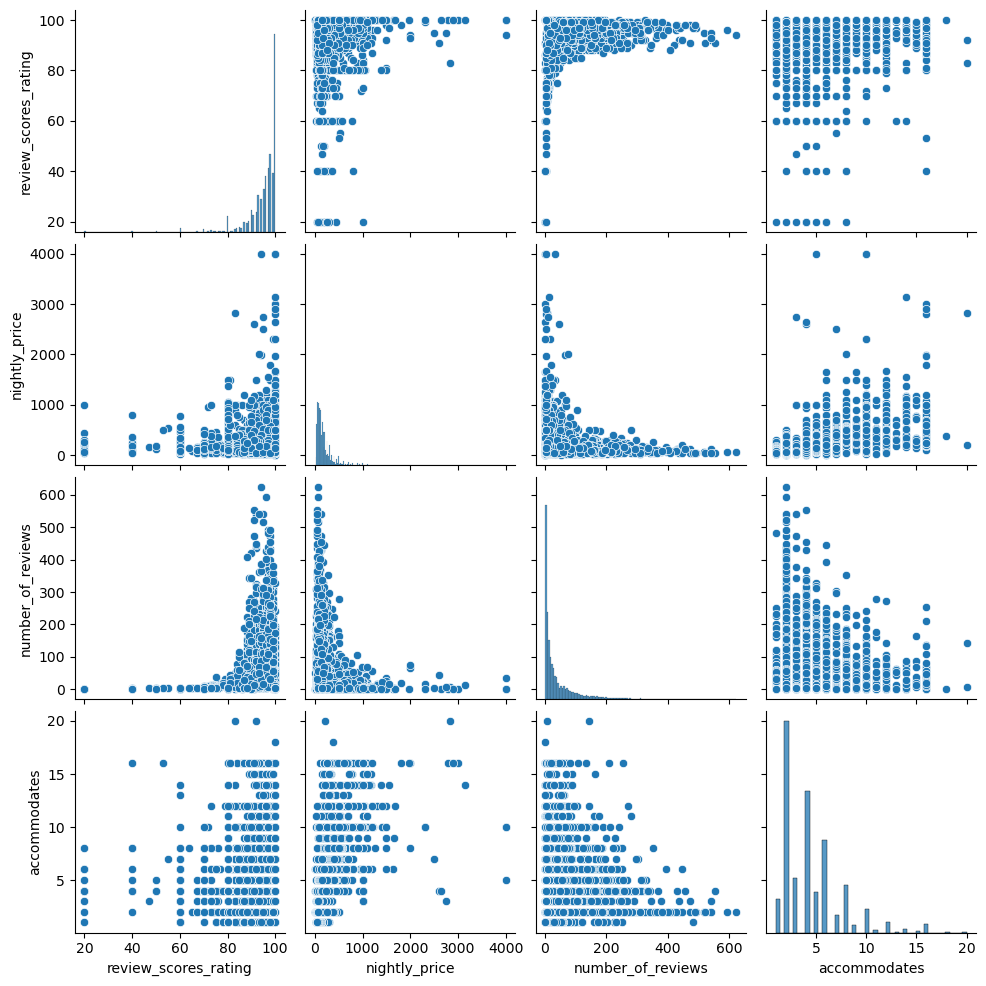

In [431]:
important_cols = ['review_scores_rating', 'nightly_price', 'number_of_reviews', 'accommodates']
sns.pairplot(df[important_cols])
plt.show()


In [432]:
import numpy as np

skewed_cols = ['nightly_price', 'price_per_stay', 'number_of_reviews', 'host_total_listings_count', 'number_of_stays']

for col in skewed_cols:
    df[f'{col}'] = np.log1p(df[col])


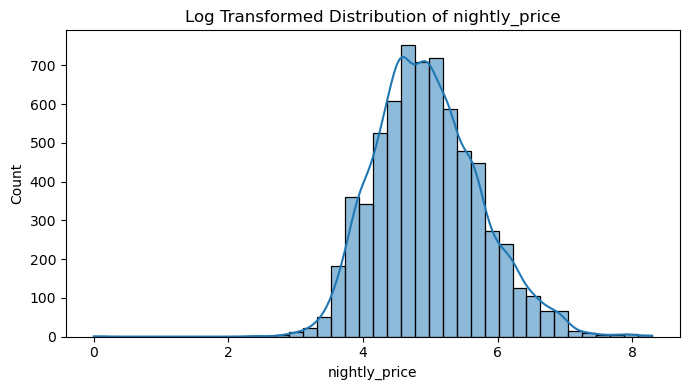

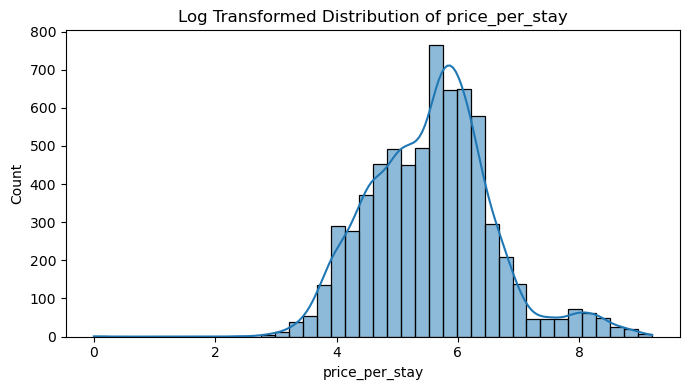

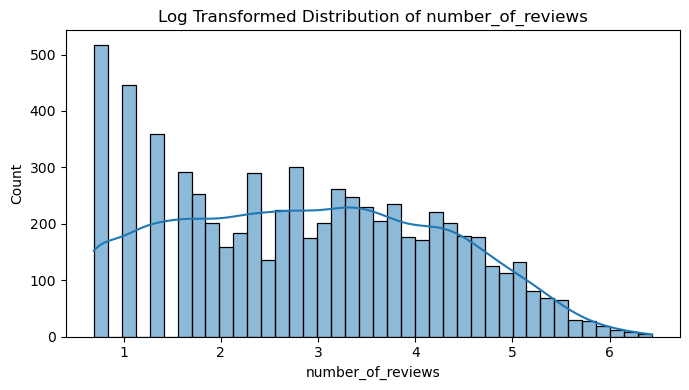

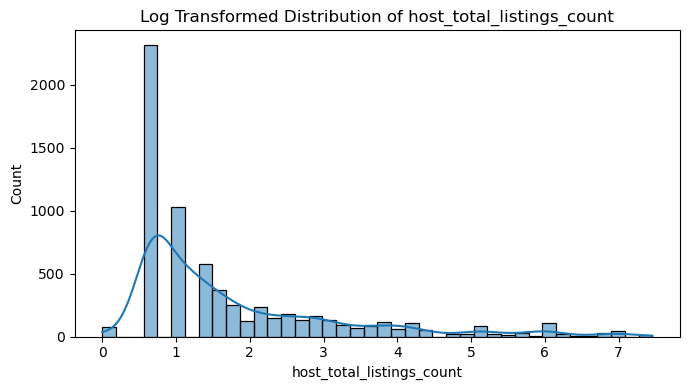

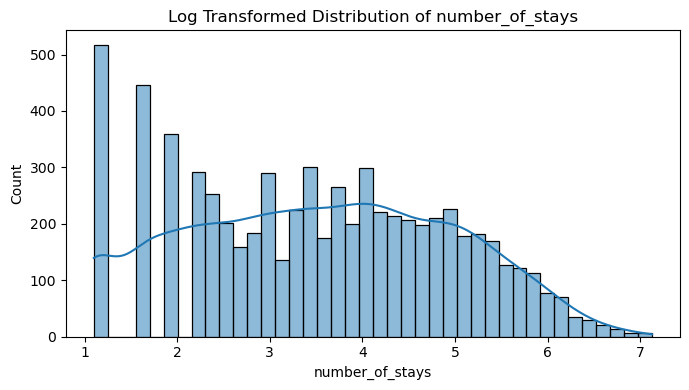

In [433]:
for col in skewed_cols:
    plt.figure(figsize=(7, 4))
    sns.histplot(df[f'{col}'], kde=True, bins=40)
    plt.title(f'Log Transformed Distribution of {col}')
    plt.tight_layout()
    plt.show()


# Check and Handle Outlires

In [434]:
# check outliers
numeric_cols = df.select_dtypes(include="number").columns

lowerUpperOutliers= {}
for col in numeric_cols:
    q25, q75 = np.percentile(df[col], 25), np.percentile(df[col], 75)
    iqr = q75 - q25
    cut_off = iqr * 1.5
    lower, upper = q25 - cut_off, q75 + cut_off
    outliers = (df[col] < lower) | (df[col] > upper)
    index_label = df[outliers].index
    print(f'Number of outliers in {col}: {len(index_label)}')
    lowerUpperOutliers[col]=[]
    lowerUpperOutliers[col].append(lower)
    lowerUpperOutliers[col].append(upper)

with open('lowerUpperOutliersForPickle_reg.pkl', 'wb') as file:
    pickle.dump(lowerUpperOutliers, file)

Number of outliers in id: 0
Number of outliers in host_id: 33
Number of outliers in host_response_rate: 1190
Number of outliers in host_total_listings_count: 407
Number of outliers in latitude: 394
Number of outliers in longitude: 39
Number of outliers in accommodates: 144
Number of outliers in bathrooms: 165
Number of outliers in bedrooms: 487
Number of outliers in beds: 249
Number of outliers in nightly_price: 48
Number of outliers in price_per_stay: 150
Number of outliers in security_deposit: 533
Number of outliers in cleaning_fee: 372
Number of outliers in guests_included: 397
Number of outliers in extra_people: 241
Number of outliers in minimum_nights: 480
Number of outliers in maximum_nights: 2
Number of outliers in number_of_reviews: 0
Number of outliers in number_of_stays: 0
Number of outliers in review_scores_rating: 369


In [435]:
import numpy as np

numeric_cols = df.select_dtypes(include="number").columns

for col in numeric_cols:
    q1 = np.percentile(df[col], 25)
    q3 = np.percentile(df[col], 75)
    iqr = (q3 - q1) * 1.5
    lower_bound = q1 - iqr
    upper_bound = q3 + iqr

    df[col] = np.where(df[col] < lower_bound, lower_bound, df[col])
    df[col] = np.where(df[col] > upper_bound, upper_bound, df[col])


In [436]:
# check outliers
numeric_cols = df.select_dtypes(include="number").columns
for col in numeric_cols:
    q25, q75 = np.percentile(df[col], 25), np.percentile(df[col], 75)
    iqr = q75 - q25
    cut_off = iqr * 1.5
    lower, upper = q25 - cut_off, q75 + cut_off
    outliers = (df[col] < lower) | (df[col] > upper)
    index_label = df[outliers].index
    print(f'Number of outliers in {col}: {len(index_label)}')


Number of outliers in id: 0
Number of outliers in host_id: 0
Number of outliers in host_response_rate: 0
Number of outliers in host_total_listings_count: 0
Number of outliers in latitude: 0
Number of outliers in longitude: 0
Number of outliers in accommodates: 0
Number of outliers in bathrooms: 0
Number of outliers in bedrooms: 0
Number of outliers in beds: 0
Number of outliers in nightly_price: 0
Number of outliers in price_per_stay: 0
Number of outliers in security_deposit: 0
Number of outliers in cleaning_fee: 0
Number of outliers in guests_included: 0
Number of outliers in extra_people: 0
Number of outliers in minimum_nights: 0
Number of outliers in maximum_nights: 0
Number of outliers in number_of_reviews: 0
Number of outliers in number_of_stays: 0
Number of outliers in review_scores_rating: 0


# Feature Engineering

In [437]:
# Ensure host_total_listings_count and host_avg_ratings are either dictionaries or Series indexed by 'host_id'
# Example for these mappings (assuming they are Series or dictionaries)
# host_total_listings_count = {host_id: count_value, ...}
# host_avg_ratings = {host_id: rating_value, ...}

# Create host_total_listings_count dictionary (replace with your actual logic)
host_total_listings_count = df.groupby('host_id')['host_id'].count().to_dict()

# Create host_avg_ratings dictionary (replace with your actual logic)
# Assuming 'review_scores_rating' is the relevant column for average ratings
# host_avg_ratings = df.groupby('host_id')['review_scores_rating'].mean().to_dict()
# df['host_avg_rating'] = df['host_id'].map(lambda x: host_avg_ratings.get(x, np.nan))  # Default to NaN if missing

# Use .get() to safely map values to avoid errors for missing keys
df['host_experience'] = np.log1p(df['host_id'].map(lambda x: host_total_listings_count.get(x, 0)))  # Default to 0 if missing

In [438]:
df['stay_range'] = df['maximum_nights'] - df['minimum_nights']
host_avg_price = df.groupby('host_id')['price_per_stay'].mean().to_dict()
df['host_avg_price'] = df['host_id'].map(host_avg_price)

host_total_reviews = df.groupby('host_id')['number_of_reviews'].sum().to_dict()
df['host_total_reviews'] = df['host_id'].map(host_total_reviews)


In [439]:
# Convert 'host_response_rate' to string type first if it's not already
df['host_response_rate'] = df['host_response_rate'].astype(str)
#Now removing the '%' signs and converting to float.
df['host_response_rate'] = df['host_response_rate'].str.rstrip('%').replace('',np.nan).astype(float)

host_avg_response = df.groupby('host_id')['host_response_rate'].mean()

df['host_avg_response_rate'] = df['host_id'].map(host_avg_response)

In [440]:
host_avg_reviews = df.groupby('host_id')['number_of_reviews'].mean()
df['host_avg_reviews'] = df['host_id'].map(host_avg_reviews)

host_avg_price = df.groupby('host_id')['nightly_price'].mean()
df['host_avg_price'] = df['host_id'].map(host_avg_price)
df['host_total_listings_count_log'] = np.log1p(df['host_total_listings_count'])

df['host_experience'] = df['host_total_listings_count_log']
df['super_experience'] = df['host_experience'] * (df['host_is_superhost'] == 't').astype(int)
df['reviews_per_stay'] = df['number_of_reviews'] / (df['number_of_stays'] + 1)
#df['price_level'] = pd.qcut(df['nightly_price'], q=4, labels=['Low', 'Med-Low', 'Med-High', 'High'])
df['price_per_guest'] = df['price_per_stay'] / df['accommodates']
df['price_per_stay'] = np.log1p(df['price_per_stay'])


In [441]:
df['total_guests_capacity'] = df['guests_included'] + df['extra_people']
df['rooms_capacity'] = df['bedrooms'] * df['beds']
df['location_diff'] = df['latitude'] - df['longitude']
df['price_per_person'] = df['price_per_stay'] / df['accommodates']
df['price_diff'] = df['price_per_stay'] - df['nightly_price']

from sklearn.preprocessing import LabelEncoder

le = LabelEncoder()

from sklearn.preprocessing import LabelEncoder

le = LabelEncoder()


df['host_is_superhost'] = le.fit_transform(df['host_is_superhost'])
with open('LabelEncoder_for_host_is_superhost_reg.pkl', 'wb') as file:
    pickle.dump(le, file)
df['superhost_reviews_interaction'] = df['host_is_superhost'] * df['number_of_reviews']
df['superhost_price_interaction'] = df['host_is_superhost'] * df['price_per_stay']


In [442]:
df['host_scale'] = pd.qcut(df['host_total_listings_count'], q=4, labels=False)
#df['bad_host_score'] = df['host_total_listings_count'] + df['host_experience'] + df['host_listings_price_interaction']

df['superhost_experience_interaction'] = df['host_is_superhost'] * df['host_experience']
df['superhost_reviews_interaction2'] = df['host_is_superhost'] * df['host_total_reviews']
df['reviews_per_listing'] = df['host_total_reviews'] / (df['host_total_listings_count'] + 1)

from sklearn.cluster import KMeans
import numpy as np

cluster_features = df[['host_total_listings_count', 'host_experience', 'host_total_reviews']].fillna(0)

from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
cluster_scaled = scaler.fit_transform(cluster_features)

with open('clusterScaled_reg.pkl', 'wb') as file:
    pickle.dump(scaler, file)

kmeans = KMeans(n_clusters=4, random_state=42)
df['host_cluster'] = kmeans.fit_predict(cluster_scaled)

with open('kmeanForHostCluster_reg.pkl', 'wb') as file:
    pickle.dump(kmeans, file)

In [443]:
# Print correlation of all features with the target column
correlations = df.corr(numeric_only=True)['review_scores_rating'].sort_values(ascending=False)
print(correlations)


review_scores_rating                1.000000
host_is_superhost                   0.300185
superhost_price_interaction         0.298616
superhost_reviews_interaction       0.276008
super_experience                    0.230987
superhost_experience_interaction    0.230987
host_response_rate                  0.160351
host_avg_response_rate              0.154452
price_per_guest                     0.114480
price_per_person                    0.106182
minimum_nights                      0.094371
longitude                           0.063760
superhost_reviews_interaction2      0.060611
price_diff                          0.047826
latitude                            0.047024
id                                  0.045029
price_per_stay                      0.039511
host_id                             0.019252
extra_people                        0.010969
host_avg_reviews                    0.008226
total_guests_capacity               0.003415
number_of_reviews                  -0.008796
bathrooms 

# info about Target Column

In [444]:
df['review_scores_rating'].describe()


count    6724.000000
mean       95.889203
std         4.408733
min        85.000000
25%        94.000000
50%        97.000000
75%       100.000000
max       100.000000
Name: review_scores_rating, dtype: float64

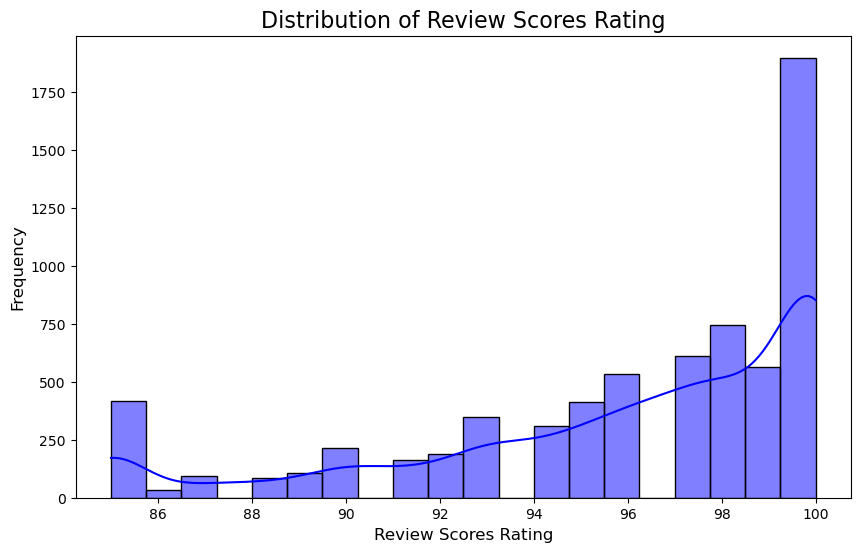

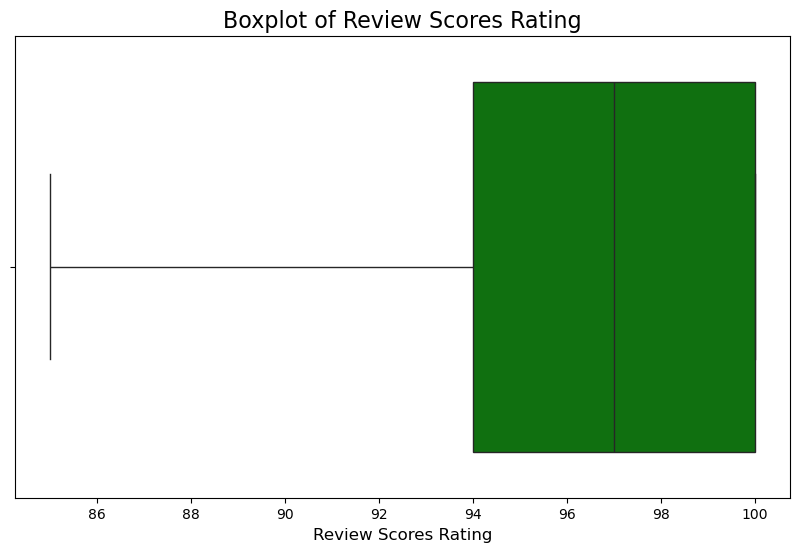

In [445]:
import matplotlib.pyplot as plt
import seaborn as sns

# Set up the figure
plt.figure(figsize=(10, 6))

# Plot histogram
sns.histplot(df['review_scores_rating'], kde=True, bins=20, color='blue')

# Add title and labels
plt.title('Distribution of Review Scores Rating', fontsize=16)
plt.xlabel('Review Scores Rating', fontsize=12)
plt.ylabel('Frequency', fontsize=12)

# Show the plot
plt.show()

# Boxplot for the review scores
plt.figure(figsize=(10, 6))
sns.boxplot(x=df['review_scores_rating'], color='green')
plt.title('Boxplot of Review Scores Rating', fontsize=16)
plt.xlabel('Review Scores Rating', fontsize=12)
plt.show()


# Drop Unnecessary columns

In [446]:
url_cols = ['listing_url', 'host_url']

cols_to_drop = id_cols + url_cols
df.drop(cols_to_drop, axis = 1 , inplace = True)

# Feature Extraction

In [447]:
# 7. Date columns preprocessing
for col in date_cols:
    if col in df.columns:
        df[col] = pd.to_datetime(df[col], errors='coerce')

# Create features from dates
reference_date = pd.Timestamp('2025-01-01')  # Use a fixed reference date for consistency
for col in date_cols:
    if col in df.columns:
        df[f'{col}_days'] = (reference_date - df[col]).dt.days

        # Extract month and year as cyclical features
        if not df[col].isna().all():
            df[f'{col}_month_sin'] = np.sin(2 * np.pi * df[col].dt.month / 12)
            df[f'{col}_month_cos'] = np.cos(2 * np.pi * df[col].dt.month / 12)
            df[f'{col}_year'] = df[col].dt.year

        # Drop original date columns
        df = df.drop(col, axis=1)


# Handle some Location Columns with Clustering "KMeans"

In [448]:
# 8.2 Location clustering باستخدام HDBSCAN
# if 'latitude' in df.columns and 'longitude' in df.columns:
#     print("Creating location clusters using HDBSCAN...")

#     coords = df[['latitude', 'longitude']].dropna()

#     # من الأفضل نعمل scaling للإحداثيات قبل الـ clustering
#     scaler = StandardScaler()
#     coords_scaled = scaler.fit_transform(coords)

#     # تطبيق HDBSCAN
#     clusterer = hdbscan.HDBSCAN(min_cluster_size=10)  # تقدر تغير الرقم حسب عدد الداتا عندك
#     cluster_labels = clusterer.fit_predict(coords_scaled)

#     # نرجّع labels للـ dataframe الأصلي
#     df.loc[coords.index, 'location_cluster'] = cluster_labels

#     # التعامل مع النقاط اللي مالهاش cluster (label = -1)
#     df['location_cluster'] = df['location_cluster'].fillna(-1).astype(int)

#     # نحسب المسافة من مركز المدينة (قبل ما نحذف الإحداثيات)
#     city_center = df[['latitude', 'longitude']].mean()
#     df['distance_to_center'] = np.sqrt(
#         (df['latitude'] - city_center['latitude'])**2 +
#         (df['longitude'] - city_center['longitude'])**2
#     )

#     # One-hot encode location clusters (مع تجاهل -1 لأنه outlier غالبًا)
#     df = pd.get_dummies(df, columns=['location_cluster'], prefix='loc_cluster')

#     # نحذف الإحداثيات الأصلية
#     #df = df.drop(['latitude', 'longitude'], axis=1)




# 8.2 Location clustering
if 'latitude' in df.columns and 'longitude' in df.columns:
    print("Creating location clusters...")
    coords = df[['latitude', 'longitude']].dropna()

    # Determine optimal number of clusters using silhouette score
    from sklearn.metrics import silhouette_score

    sil_scores = []
    k_range = range(3, 15)

    for k in k_range:
        kmeans = KMeans(n_clusters=k, random_state=RANDOM_STATE)
        labels = kmeans.fit_predict(coords)
        sil_score = silhouette_score(coords, labels)
        sil_scores.append(sil_score)

    best_k = k_range[np.argmax(sil_scores)]
    print(f"Best number of location clusters: {best_k}")

    # Create clusters with optimal k
    kmeans = KMeans(n_clusters=best_k, random_state=RANDOM_STATE)
    df['location_cluster'] = kmeans.fit_predict(df[['latitude', 'longitude']])

    # Create distance to center features
    city_center = df[['latitude', 'longitude']].mean()
    df['distance_to_center'] = np.sqrt(
        (df['latitude'] - city_center['latitude'])**2 +
        (df['longitude'] - city_center['longitude'])**2
    )

    # One-hot encode location clusters
    df = pd.get_dummies(df, columns=['location_cluster'], prefix='loc_cluster')

    # Drop original coordinates
    #df = df.drop(['latitude', 'longitude'], axis=1)


Creating location clusters...
Best number of location clusters: 4


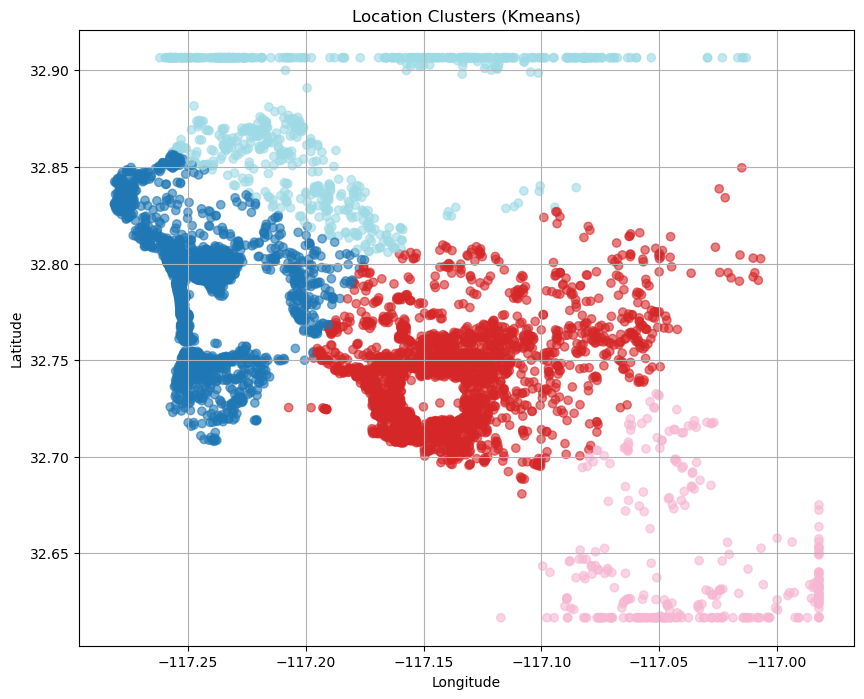

In [449]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 8))
scatter = plt.scatter(
    df['longitude'],
    df['latitude'],
    c=df.filter(like='loc_cluster_').idxmax(axis=1).str.extract('(\d+)').astype(int),
    cmap='tab20',
    alpha=0.6
)

plt.title('Location Clusters (Kmeans)')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.grid(True)
plt.show()


In [450]:
import folium
from folium.plugins import MarkerCluster
import random

df_with_coords = df.copy()
df_with_coords[['latitude', 'longitude']] = coords

map_center = [coords['latitude'].mean(), coords['longitude'].mean()]
map_clusters = folium.Map(location=map_center, zoom_start=12)

unique_clusters = sorted(df_with_coords.filter(like='loc_cluster_').idxmax(axis=1).str.extract('(\d+)')[0].astype(int).unique())
colors = plt.cm.tab20.colors
color_dict = {
    cluster: f"#{int(r*255):02x}{int(g*255):02x}{int(b*255):02x}"
    for cluster, (r, g, b) in zip(unique_clusters, colors)
}

for i, row in df_with_coords.iterrows():
    cluster = int(row.filter(like='loc_cluster_').idxmax().split('_')[-1])
    folium.CircleMarker(
        location=[row['latitude'], row['longitude']],
        radius=3,
        color=color_dict.get(cluster, '#000000'),
        fill=True,
        fill_color=color_dict.get(cluster, '#000000'),
        fill_opacity=0.7
    ).add_to(map_clusters)

map_clusters


In [451]:
df = df.drop(['latitude', 'longitude'], axis=1)

# Handle Text columns with "NLP"

In [452]:
import pandas as pd
import re
import string
from nltk.sentiment import SentimentIntensityAnalyzer
from sklearn.feature_extraction.text import TfidfVectorizer
from joblib import Parallel, delayed
import joblib
import os
import swifter

# Initialize sentiment analyzer
sia = SentimentIntensityAnalyzer()

def process_text(text):
    if pd.isna(text):
        return {
            'word_count': 0,
            'sentiment_compound': 0,
            'sentiment_pos': 0,
            'sentiment_neg': 0,
            'sentiment_neu': 0
        }

    # Clean text
    text = str(text).lower()
    text = re.sub(r'\d+', '', text)  # Remove numbers
    text = text.translate(str.maketrans('', '', string.punctuation))

    # Count words
    word_count = len(text.split())

    # Get sentiment
    sentiment = sia.polarity_scores(text)

    return {
        'word_count': word_count,
        'sentiment_compound': sentiment['compound'],
        'sentiment_pos': sentiment['pos'],
        'sentiment_neg': sentiment['neg'],
        'sentiment_neu': sentiment['neu']
    }

# Function to process text columns in parallel and extract sentiment features

def process_column(df, col):
    print(f"  Processing {col}...")
    text_features = df[col].swifter.apply(process_text)  # Using swifter to parallelize the apply method

    # Convert list of dicts to dataframe
    text_features_df = pd.DataFrame(text_features.tolist())

    # Add column prefix
    text_features_df.columns = [f"{col}_{feat}" for feat in text_features_df.columns]
   
    return text_features_df

def apply_tfidf(df, col, max_features=20):
    MODEL_DIR = "sayed"
    os.makedirs(MODEL_DIR, exist_ok=True)
    print(f"Applying TF-IDF on: {col}")
    tfidf = TfidfVectorizer(max_features=max_features, stop_words='english')

    # Fill NaNs with empty strings and apply TF-IDF
    tfidf_matrix = tfidf.fit_transform(df[col].fillna(""))

    # Create a DataFrame from TF-IDF matrix
    tfidf_df = pd.DataFrame(tfidf_matrix.toarray(), columns=[f"{col}_tfidf_{feat}" for feat in tfidf.get_feature_names_out()])
    joblib.dump(tfidf, os.path.join(MODEL_DIR, f"{col}_tfidf_vectorizer_reg.joblib"))
    # Save column names
    joblib.dump(list(tfidf_df.columns), os.path.join(MODEL_DIR, f"{col}_tfidf_columns_reg.joblib"))
    return tfidf_df

# Process each text column for sentiment analysis and word count
for col in text_cols:
    if col in df.columns:
        # Process text column for sentiment and word count
        text_features_df = process_column(df, col)

        # Add sentiment features to main dataframe
        df = pd.concat([df, text_features_df], axis=1)

        # Apply TF-IDF on the text column
        tfidf_df = apply_tfidf(df, col)

        # Add TF-IDF features to main dataframe
        df = pd.concat([df, tfidf_df], axis=1)

        # Drop original text column (optional)
        df = df.drop(col, axis=1)



  Processing name...


Pandas Apply:   0%|          | 0/6724 [00:00<?, ?it/s]

Applying TF-IDF on: name
  Processing summary...


Pandas Apply:   0%|          | 0/6724 [00:00<?, ?it/s]

Applying TF-IDF on: summary
  Processing space...


Pandas Apply:   0%|          | 0/6724 [00:00<?, ?it/s]

Applying TF-IDF on: space
  Processing description...


Pandas Apply:   0%|          | 0/6724 [00:00<?, ?it/s]

Applying TF-IDF on: description
  Processing neighborhood_overview...


Pandas Apply:   0%|          | 0/6724 [00:00<?, ?it/s]

Applying TF-IDF on: neighborhood_overview
  Processing notes...


Pandas Apply:   0%|          | 0/6724 [00:00<?, ?it/s]

Applying TF-IDF on: notes
  Processing transit...


Pandas Apply:   0%|          | 0/6724 [00:00<?, ?it/s]

Applying TF-IDF on: transit
  Processing access...


Pandas Apply:   0%|          | 0/6724 [00:00<?, ?it/s]

Applying TF-IDF on: access
  Processing interaction...


Pandas Apply:   0%|          | 0/6724 [00:00<?, ?it/s]

Applying TF-IDF on: interaction
  Processing house_rules...


Pandas Apply:   0%|          | 0/6724 [00:00<?, ?it/s]

Applying TF-IDF on: house_rules
  Processing host_about...


Pandas Apply:   0%|          | 0/6724 [00:00<?, ?it/s]

Applying TF-IDF on: host_about


In [453]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6724 entries, 0 to 6723
Columns: 359 entries, host_name to host_about_tfidf_years
dtypes: bool(4), float64(308), int32(5), int64(15), object(27)
memory usage: 18.1+ MB


In [454]:
sentiment_cols = df.columns[df.columns.str.contains('sentiment')]
print(df[sentiment_cols].describe())


       name_sentiment_compound  name_sentiment_pos  name_sentiment_neg  \
count              6724.000000         6724.000000         6724.000000   
mean                  0.176377            0.152543            0.010476   
std                   0.276041            0.217896            0.053987   
min                  -0.648600            0.000000            0.000000   
25%                   0.000000            0.000000            0.000000   
50%                   0.000000            0.000000            0.000000   
75%                   0.440400            0.351000            0.000000   
max                   0.902200            0.884000            0.688000   

       name_sentiment_neu  summary_sentiment_compound  summary_sentiment_pos  \
count         6724.000000                 6724.000000            6724.000000   
mean             0.836982                    0.712885               0.162124   
std              0.219780                    0.324145               0.093743   
min          

Text(0.5, 1.0, 'Distribution of Sentiment (Compound) in interaction')

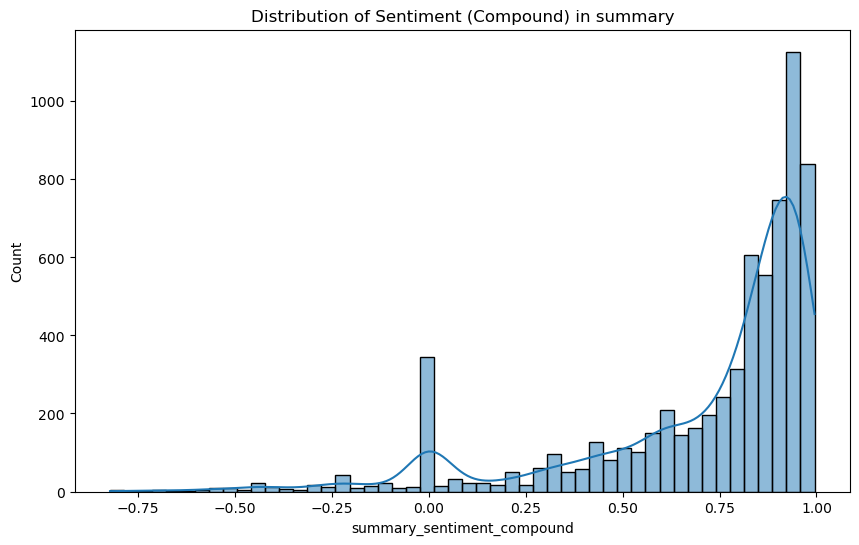

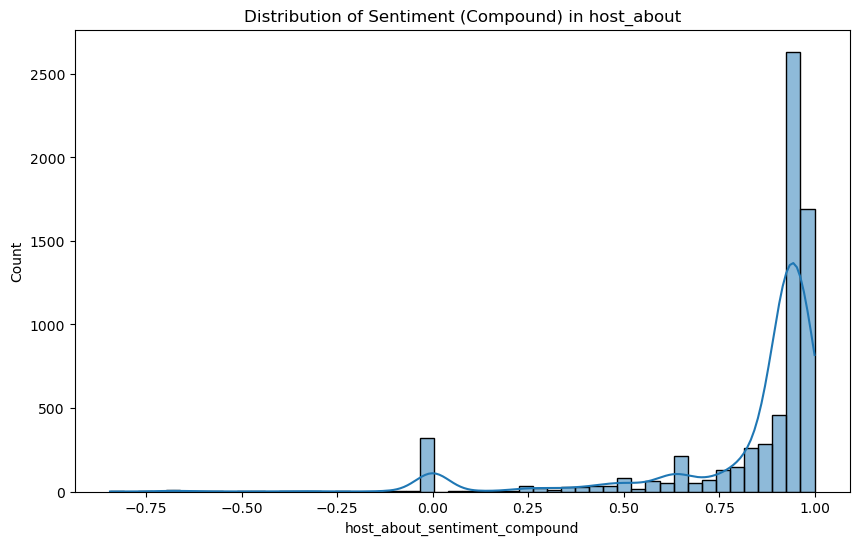

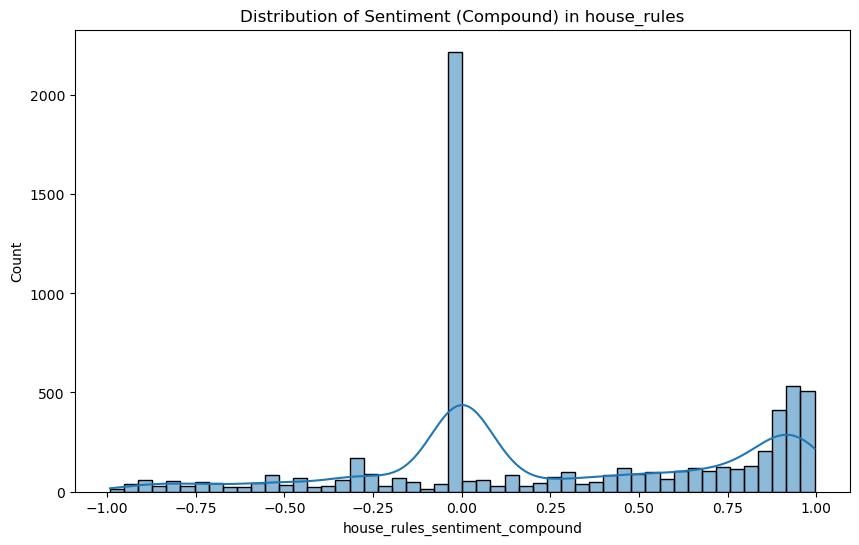

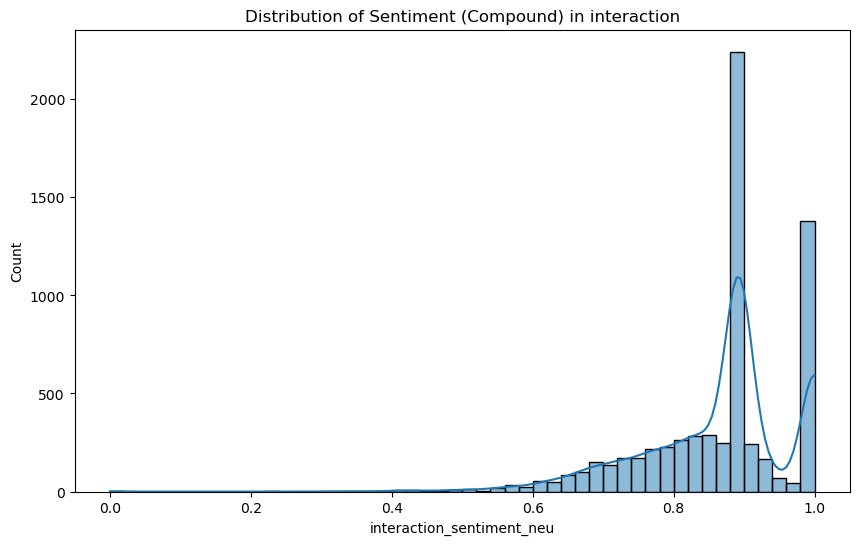

In [455]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(10,6))
sns.histplot(df['summary_sentiment_compound'], bins=50, kde=True)
plt.title("Distribution of Sentiment (Compound) in summary")
plt.figure(figsize=(10,6))
sns.histplot(df['host_about_sentiment_compound'], bins=50, kde=True)
plt.title("Distribution of Sentiment (Compound) in host_about")
plt.figure(figsize=(10,6))
sns.histplot(df['house_rules_sentiment_compound'], bins=50, kde=True)
plt.title("Distribution of Sentiment (Compound) in house_rules")
plt.figure(figsize=(10,6))
sns.histplot(df['interaction_sentiment_neu'], bins=50, kde=True)
plt.title("Distribution of Sentiment (Compound) in interaction")


In [456]:
df['host_sentiment_label'] = df['host_about_sentiment_compound'].apply(
    lambda x: 'positive' if x > 0.5 else 'neutral' if x > 0 else 'negative'
)


Text(0.5, 1.0, 'Relationship between Host Sentiment and Price')

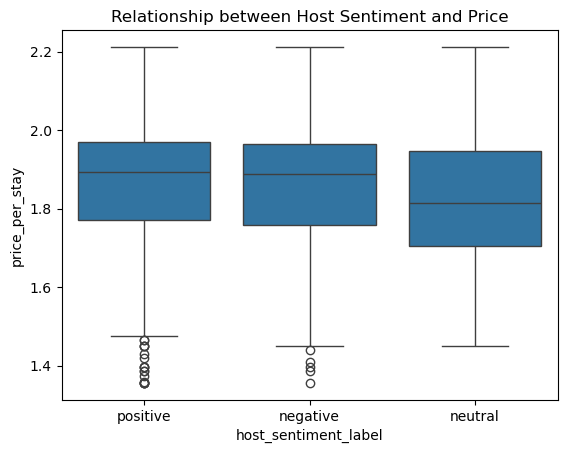

In [457]:
sns.boxplot(data=df, x='host_sentiment_label', y='price_per_stay')
plt.title("Relationship between Host Sentiment and Price")


In [458]:
df['overall_sentiment_score'] = (
    df[['summary_sentiment_compound', 'space_sentiment_compound', 'host_about_sentiment_compound']].mean(axis=1)
)


In [459]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6724 entries, 0 to 6723
Columns: 361 entries, host_name to overall_sentiment_score
dtypes: bool(4), float64(309), int32(5), int64(15), object(28)
memory usage: 18.2+ MB


In [460]:
cols_to_drop = [
    col for col in df.columns
    if col.endswith('_sentiment_neg') or
       col.endswith('_sentiment_neu') or
       col.startswith('name_sentiment')
]
df.drop(columns=cols_to_drop, inplace=True)


In [461]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6724 entries, 0 to 6723
Columns: 337 entries, host_name to overall_sentiment_score
dtypes: bool(4), float64(285), int32(5), int64(15), object(28)
memory usage: 17.0+ MB


In [462]:
important_sentiment_cols = [
    'summary_sentiment_compound',
    'space_sentiment_compound',
    'host_about_sentiment_compound',
    'house_rules_sentiment_compound',
    'interaction_sentiment_compound'
]

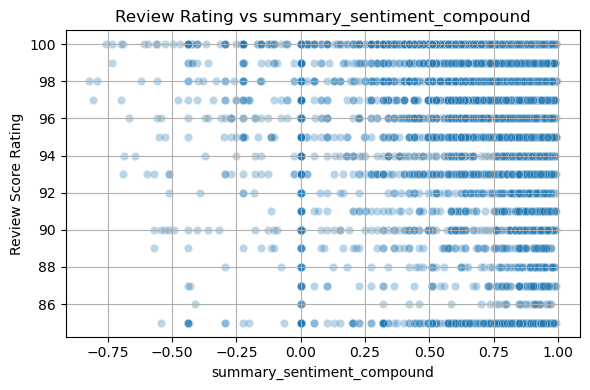

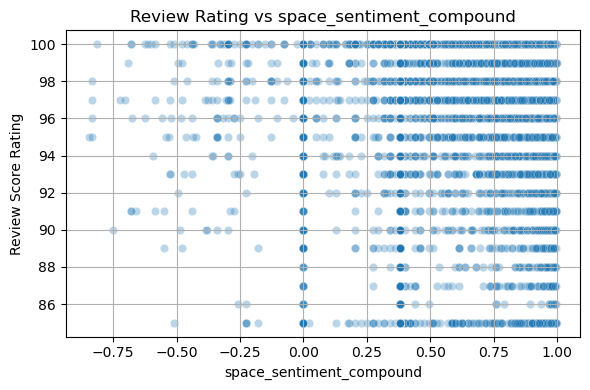

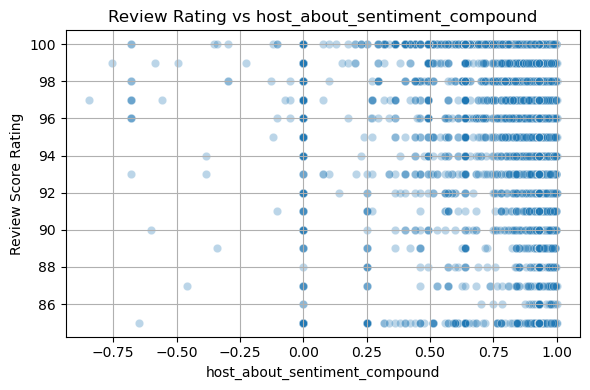

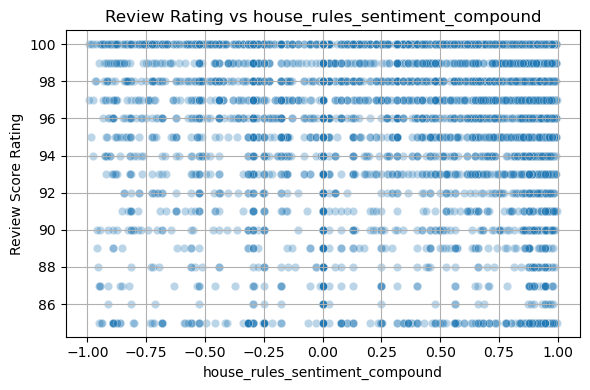

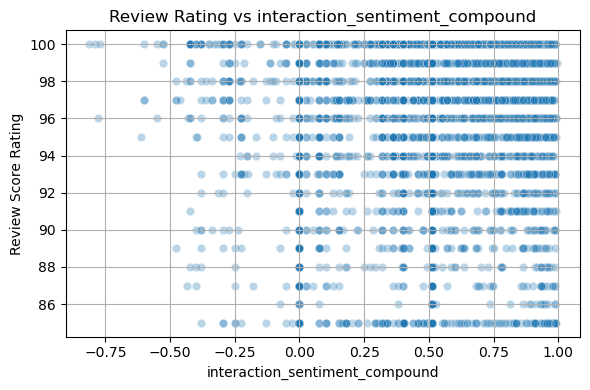


📊 Correlation with Review Score Rating:

review_scores_rating              1.000000
summary_sentiment_compound        0.027937
interaction_sentiment_compound    0.023622
host_about_sentiment_compound     0.004154
house_rules_sentiment_compound   -0.008840
space_sentiment_compound         -0.013219
Name: review_scores_rating, dtype: float64


In [463]:
import matplotlib.pyplot as plt
import seaborn as sns

if 'review_scores_rating' in df.columns:
    for col in important_sentiment_cols:
        # Scatter plot
        plt.figure(figsize=(6, 4))
        sns.scatterplot(data=df, x=col, y='review_scores_rating', alpha=0.3)
        plt.title(f'Review Rating vs {col}')
        plt.xlabel(col)
        plt.ylabel('Review Score Rating')
        plt.grid(True)
        plt.tight_layout()
        plt.show()

    # Correlation table
    correlation = df[important_sentiment_cols + ['review_scores_rating']].corr()
    print("\n📊 Correlation with Review Score Rating:\n")
    print(correlation['review_scores_rating'].sort_values(ascending=False))


In [464]:
cols_to_drop = [
    'space_sentiment_compound',
    'house_rules_sentiment_compound'
]
df = df.drop(columns=cols_to_drop)


In [465]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6724 entries, 0 to 6723
Columns: 335 entries, host_name to overall_sentiment_score
dtypes: bool(4), float64(283), int32(5), int64(15), object(28)
memory usage: 16.9+ MB


# Feature Engineering

In [466]:
# Interaction between accommodates and bedrooms
if 'accommodates' in df.columns and 'bedrooms' in df.columns:
    df['person_per_bedroom'] = df['accommodates'] / (df['bedrooms'] + 0.1)  # Add 0.1 to avoid division by zero

# Interaction between price and accommodates
if 'nightly_price' in df.columns and 'accommodates' in df.columns:
    df['price_per_person'] = df['nightly_price'] / (df['accommodates'] + 0.1)

# Interaction between reviews and host features
if 'number_of_reviews' in df.columns and 'host_is_superhost' in df.columns:
    # Convert binary text values to numeric if needed
    if df['host_is_superhost'].dtype == 'object':
        df['host_is_superhost'] = df['host_is_superhost'].map({'t': 1, 'f': 0})

    df['superhost_review_interaction'] = df['host_is_superhost'] * df['number_of_reviews']


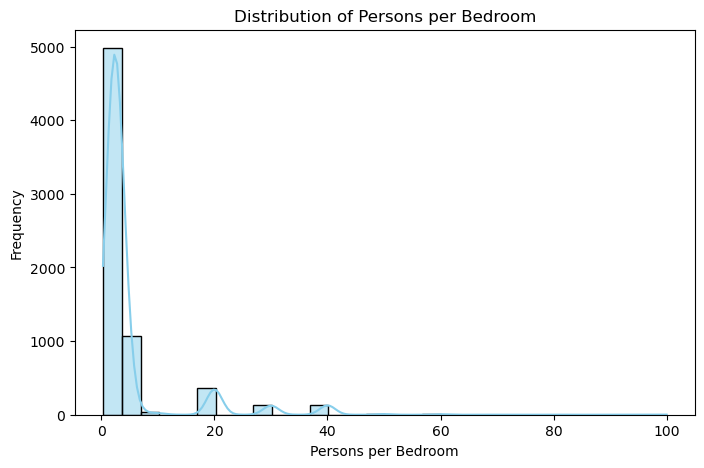

In [467]:
plt.figure(figsize=(8, 5))
sns.histplot(df['person_per_bedroom'], bins=30, kde=True, color='skyblue')
plt.title('Distribution of Persons per Bedroom')
plt.xlabel('Persons per Bedroom')
plt.ylabel('Frequency')
plt.show()


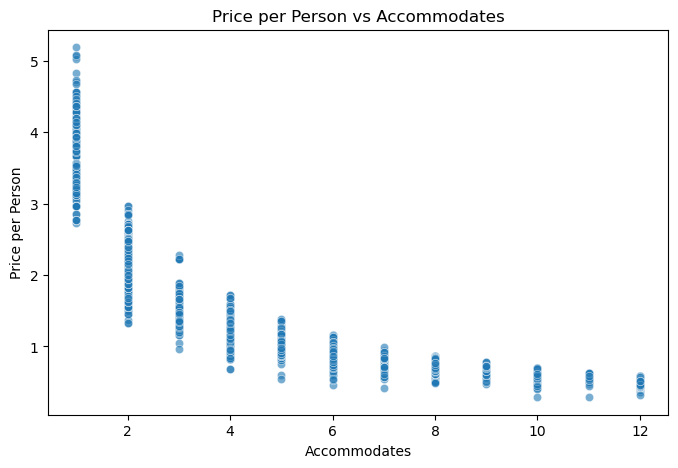

In [468]:
plt.figure(figsize=(8, 5))
sns.scatterplot(data=df, x='accommodates', y='price_per_person', alpha=0.6)
plt.title('Price per Person vs Accommodates')
plt.xlabel('Accommodates')
plt.ylabel('Price per Person')
plt.show()


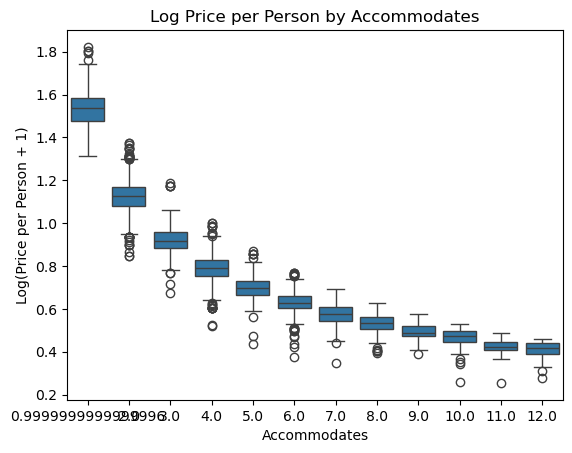

In [469]:
df['price_per_person'] = np.log1p(df['price_per_person'])

sns.boxplot(x='accommodates', y='price_per_person', data=df)
plt.title('Log Price per Person by Accommodates')
plt.xlabel('Accommodates')
plt.ylabel('Log(Price per Person + 1)')
plt.show()


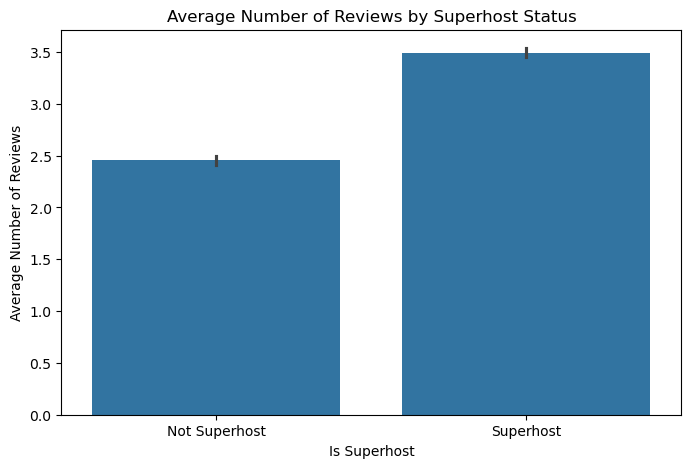

In [470]:
plt.figure(figsize=(8, 5))
sns.barplot(x='host_is_superhost', y='number_of_reviews', data=df)
plt.title('Average Number of Reviews by Superhost Status')
plt.xlabel('Is Superhost')
plt.ylabel('Average Number of Reviews')
plt.xticks([0, 1], ['Not Superhost', 'Superhost'])
plt.show()


# Handle amenities column

In [471]:
# 8.4 Process amenities
if 'amenities' in df.columns:
    print("Processing amenities...")
    df['amenities'] = df['amenities'].astype(str).str.lower()

    # Clean and extract amenities
    def clean_amenities(amenities_str):
        amenities_str = amenities_str.strip('{}')
        return {item.strip().strip('"').strip("'") for item in amenities_str.split(',') if item.strip()}

    df['amenities_set'] = df['amenities'].apply(clean_amenities)

    # Count amenities
    df['amenities_count'] = df['amenities_set'].apply(len)

    # Check for important amenities
    important_amenities = [
        'wifi', 'internet', 'kitchen', 'washer', 'dryer', 'dishwasher',
        'air conditioning', 'heating', 'tv', 'pool', 'gym', 'free parking',
        'breakfast', 'wheelchair', 'elevator', 'hot tub', 'workspace'
    ]

    for amenity in important_amenities:
        df[f'has_{amenity.replace(" ", "_")}'] = df['amenities_set'].apply(
            lambda x: any(amenity in item for item in x)
        ).astype(int)

    # Create amenity score based on TF-IDF concept
    flat_list = [item for sublist in df['amenities_set'] for item in sublist]
    from collections import Counter
    word_counts = Counter(flat_list)

    # Calculate inverse frequency - rare amenities get higher scores
    total_listings = len(df)
    word_rates = {word: np.log(total_listings / count) for word, count in word_counts.items()}

    # Calculate amenity score for each listing
    df['amenity_score'] = df['amenities_set'].apply(lambda s: sum(word_rates.get(w, 0) for w in s))

    # Drop intermediate columns
    df = df.drop(['amenities', 'amenities_set'], axis=1)


Processing amenities...


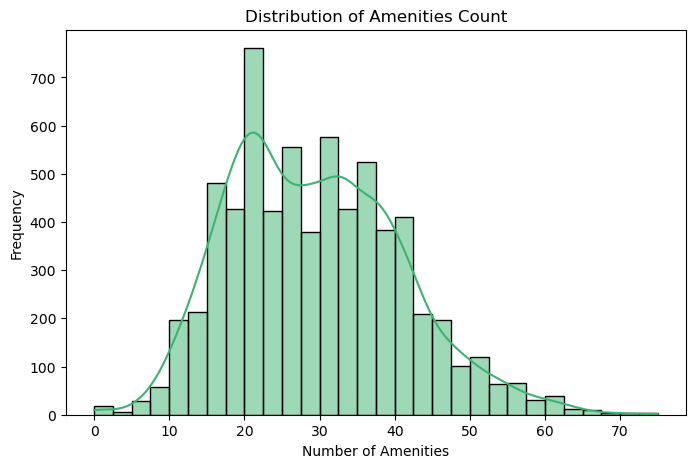

In [472]:
plt.figure(figsize=(8, 5))
sns.histplot(df['amenities_count'], bins=30, kde=True, color='mediumseagreen')
plt.title('Distribution of Amenities Count')
plt.xlabel('Number of Amenities')
plt.ylabel('Frequency')
plt.show()



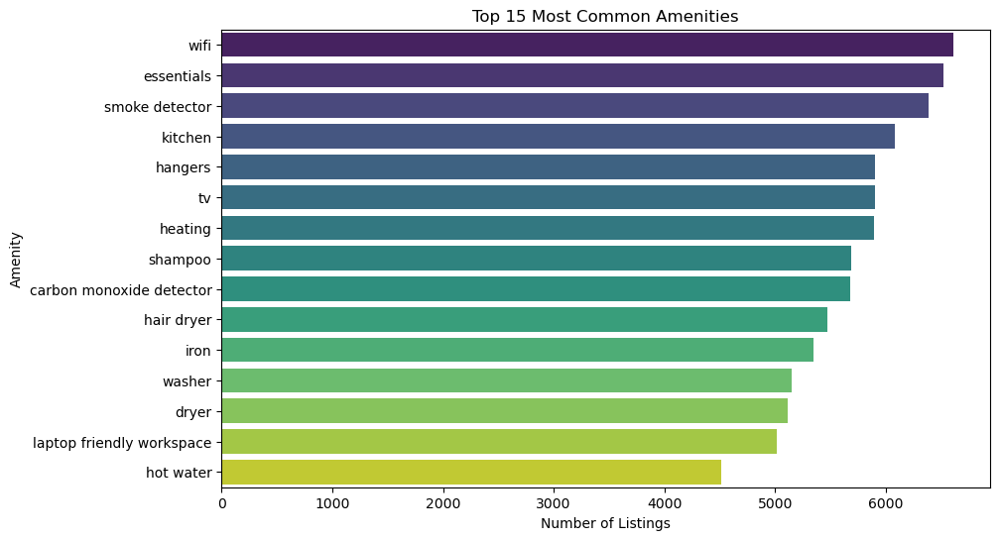

In [473]:
common_amenities = pd.Series(flat_list).value_counts().head(15)

plt.figure(figsize=(10, 6))
sns.barplot(x=common_amenities.values, y=common_amenities.index, palette='viridis')
plt.title('Top 15 Most Common Amenities')
plt.xlabel('Number of Listings')
plt.ylabel('Amenity')
plt.show()


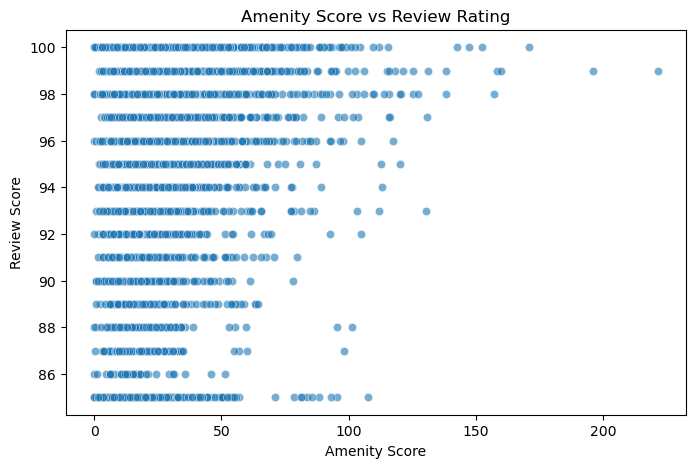

In [474]:
if 'review_scores_rating' in df.columns:
    plt.figure(figsize=(8, 5))
    sns.scatterplot(x='amenity_score', y='review_scores_rating', data=df, alpha=0.6)
    plt.title('Amenity Score vs Review Rating')
    plt.xlabel('Amenity Score')
    plt.ylabel('Review Score')
    plt.show()


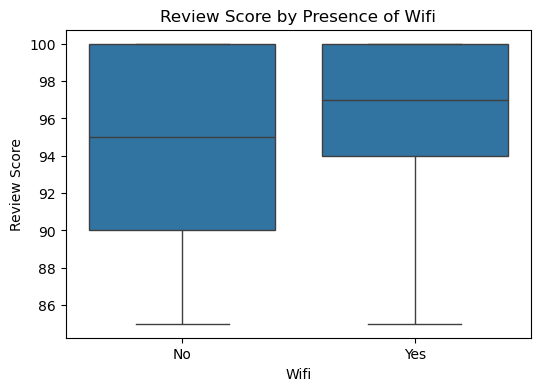

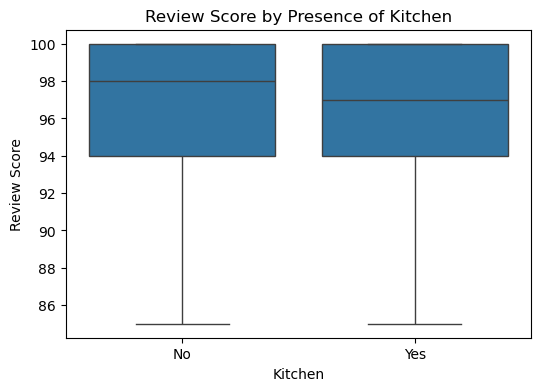

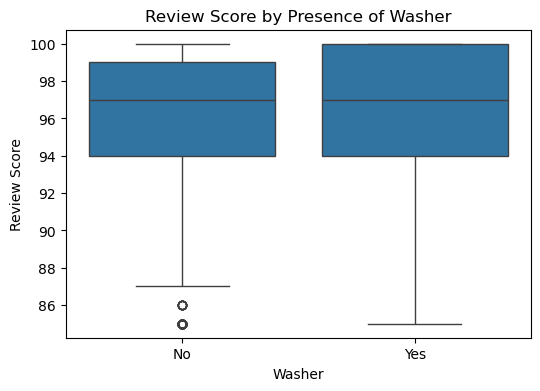

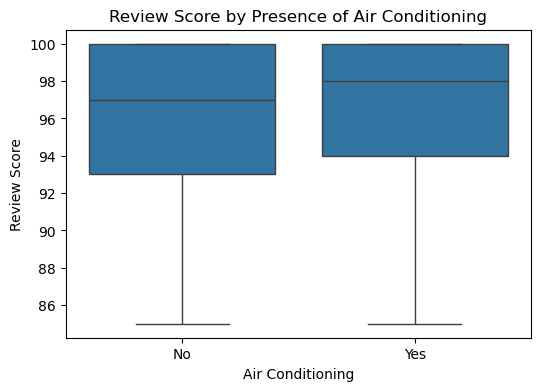

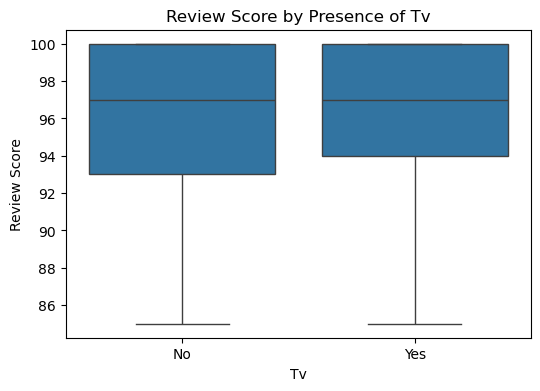

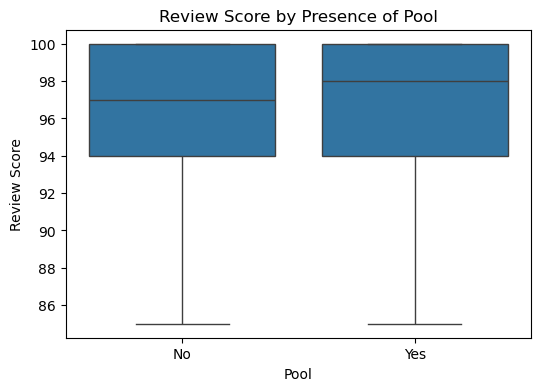

In [475]:
important_amenities_viz = ['wifi', 'kitchen', 'washer', 'air_conditioning', 'tv', 'pool']

for amenity in important_amenities_viz:
    col = f'has_{amenity}'
    if col in df.columns and 'review_scores_rating' in df.columns:
        plt.figure(figsize=(6, 4))
        sns.boxplot(x=col, y='review_scores_rating', data=df)
        plt.title(f'Review Score by Presence of {amenity.replace("_", " ").title()}')
        plt.xlabel(amenity.replace("_", " ").title())
        plt.ylabel('Review Score')
        plt.xticks([0, 1], ['No', 'Yes'])
        plt.show()


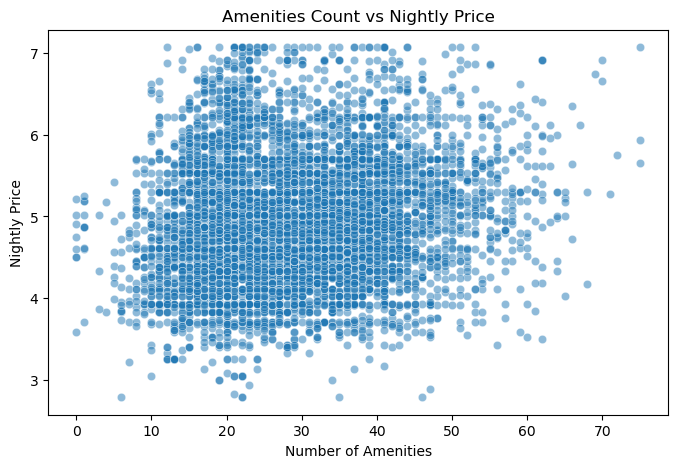

In [476]:
if 'nightly_price' in df.columns:
    plt.figure(figsize=(8, 5))
    sns.scatterplot(x='amenities_count', y='nightly_price', data=df, alpha=0.5)
    plt.title('Amenities Count vs Nightly Price')
    plt.xlabel('Number of Amenities')
    plt.ylabel('Nightly Price')
    plt.show()


# Handle Property_type Column

In [477]:
# 8.5 Property type grouping
if 'property_type' in df.columns:
    print("Grouping property types...")
    property_groups = {
        'Apartments': ['Apartment', 'Condominium', 'Loft', 'Serviced apartment', 'Aparthotel'],
        'Houses': ['House', 'Villa', 'Townhouse', 'Vacation home'],
        'Small_Accommodations': ['Bungalow', 'Cottage', 'Tiny house', 'Earth house'],
        'Unique_Stays': ['Treehouse', 'Boat', 'Castle', 'Cave', 'Igloo', 'Bus', 'Dome house', 'Tent'],
        'Hosted_Stays': ['Guest suite', 'Guesthouse', 'Bed and breakfast', 'Hostel', 'Boutique hotel', 'Hotel'],
        'Nature_Stays': ['Camper/RV', 'Campsite', 'Farm stay', 'Cabin', 'Chalet', 'Nature lodge'],
        'Other': ['Other', 'Resort', 'Casa particular (Cuba)']
    }

    def map_property_type(prop_type):
        for group, types in property_groups.items():
            if any(t.lower() in prop_type.lower() for t in types):
                return group
        return 'Other'

    df['property_type_grouped'] = df['property_type'].apply(map_property_type)

    property_rating_mean = df.groupby('property_type_grouped')['review_scores_rating'].mean()

    df['property_type_encoded'] = df['property_type_grouped'].map(property_rating_mean)

    df.drop(['property_type', 'property_type_grouped'], axis=1, inplace=True)

Grouping property types...


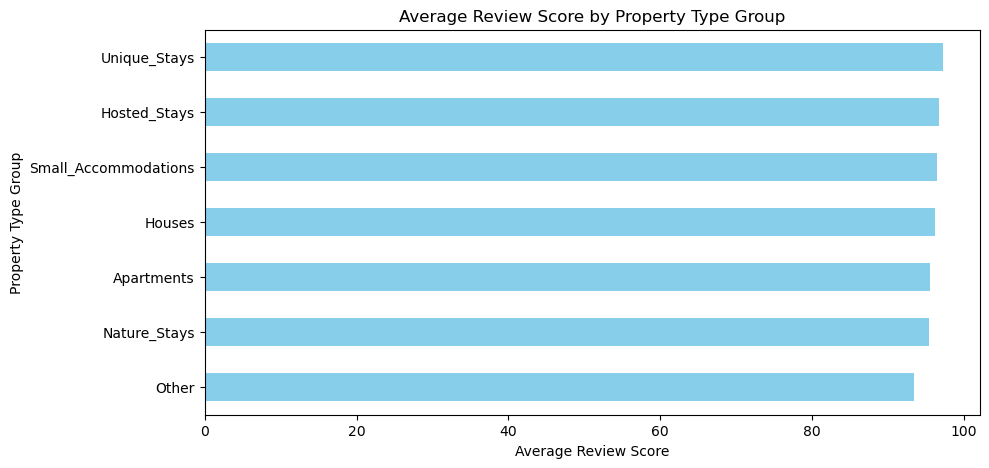

In [478]:
plt.figure(figsize=(10, 5))
property_rating_mean.sort_values().plot(kind='barh', color='skyblue')
plt.title('Average Review Score by Property Type Group')
plt.xlabel('Average Review Score')
plt.ylabel('Property Type Group')
plt.show()


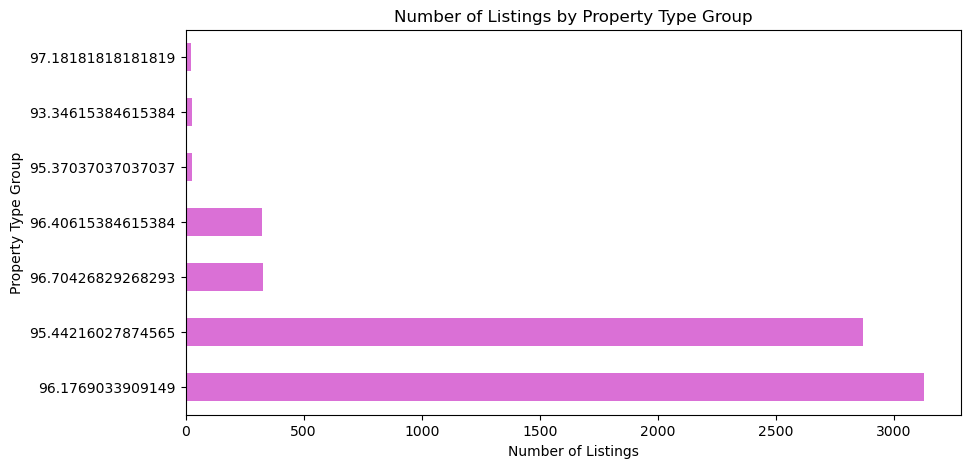

In [479]:
counts = df['property_type_encoded'].value_counts()

plt.figure(figsize=(10, 5))
counts.plot(kind='barh', color='orchid')
plt.title('Number of Listings by Property Type Group')
plt.xlabel('Number of Listings')
plt.ylabel('Property Type Group')
plt.show()

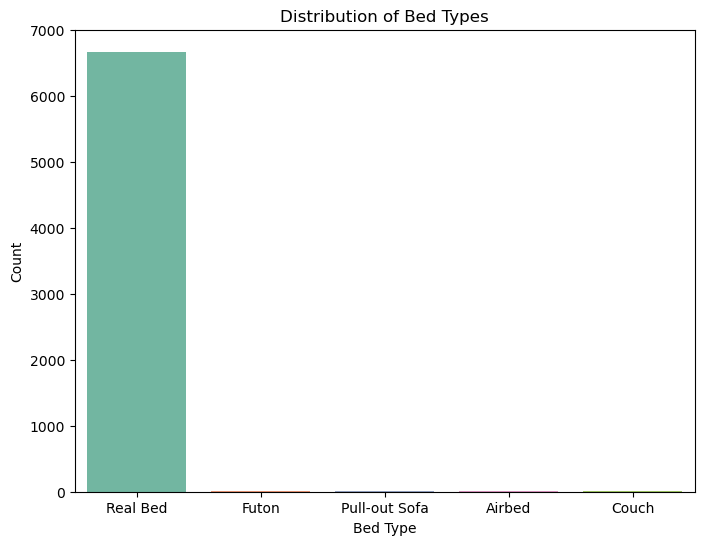

In [480]:
plt.figure(figsize=(8, 6))
sns.countplot(data=df, x='bed_type', palette='Set2')
plt.title('Distribution of Bed Types')
plt.xlabel('Bed Type')
plt.ylabel('Count')
plt.show()

In [481]:
# 8.6 Bed type processing
if 'bed_type' in df.columns:
    print("Processing bed types...")
    # Simplify to Real Bed vs Other
    df['bed_type'] = df['bed_type'].apply(lambda x: x if x == 'Real Bed' else 'Other')
    df = pd.get_dummies(df, columns=['bed_type'], prefix='bed', drop_first=True)


Processing bed types...


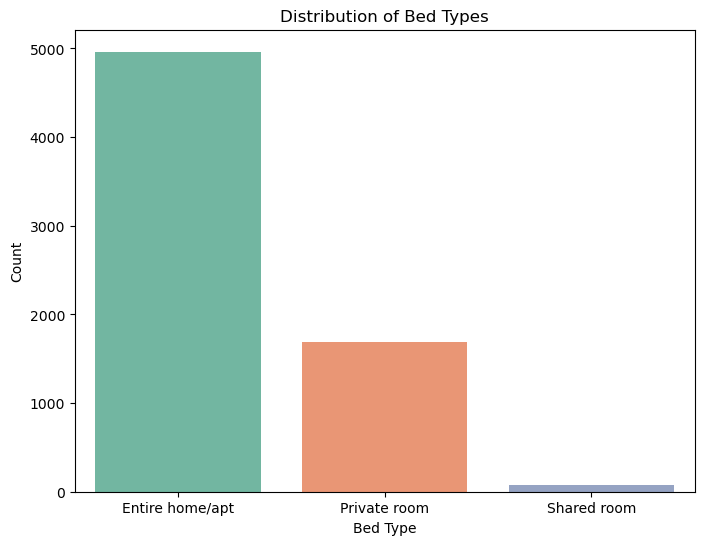

In [482]:
plt.figure(figsize=(8, 6))
sns.countplot(data=df, x='room_type', palette='Set2')
plt.title('Distribution of Bed Types')
plt.xlabel('Bed Type')
plt.ylabel('Count')
plt.show()

In [483]:
# 8.7 Room type processing
if 'room_type' in df.columns:
    print("Processing room types...")
    df = pd.get_dummies(df, columns=['room_type'], prefix='room', drop_first=True)

Processing room types...


In [484]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6724 entries, 0 to 6723
Columns: 356 entries, host_name to room_Shared room
dtypes: bool(7), float64(287), int32(22), int64(16), object(24)
memory usage: 17.4+ MB


In [485]:
# 8.8 Convert binary columns
binary_cols = ['host_is_superhost','host_has_profile_pic', 'host_identity_verified',
               'is_location_exact', 'instant_bookable',
               'require_guest_profile_picture', 'require_guest_phone_verification',
               'requires_license', 'is_business_travel_ready']

df[binary_cols].nunique()

host_is_superhost                   2
host_has_profile_pic                2
host_identity_verified              2
is_location_exact                   2
instant_bookable                    2
require_guest_profile_picture       2
require_guest_phone_verification    2
requires_license                    1
is_business_travel_ready            1
dtype: int64

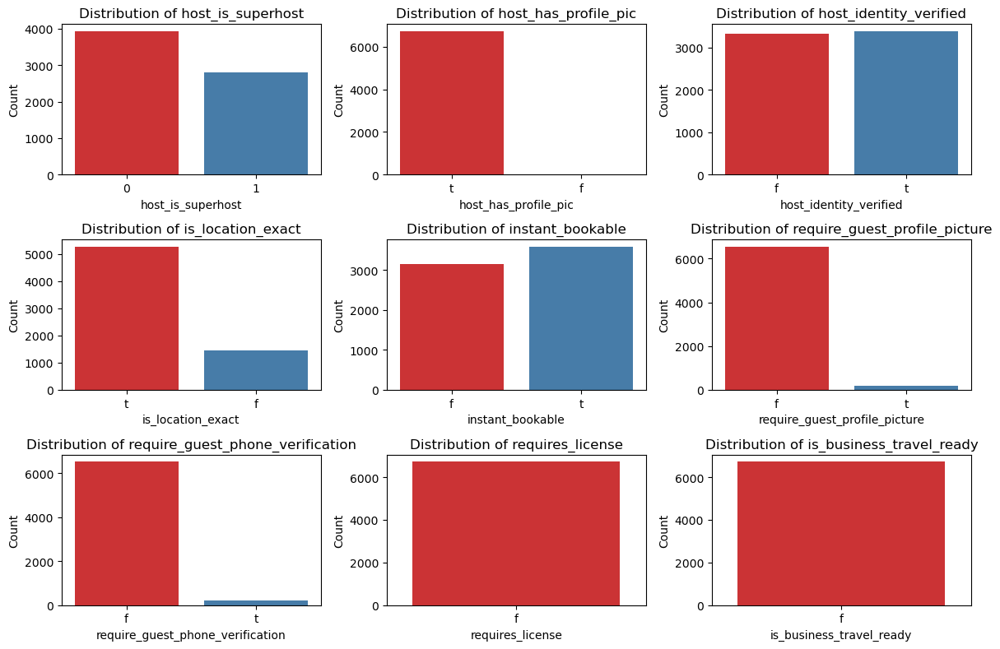

In [486]:

binary_cols = ['host_is_superhost', 'host_has_profile_pic', 'host_identity_verified',
               'is_location_exact', 'instant_bookable',
               'require_guest_profile_picture', 'require_guest_phone_verification',
               'requires_license', 'is_business_travel_ready']

plt.figure(figsize=(12, 8))
for i, col in enumerate(binary_cols, 1):
    plt.subplot(3, 3, i)
    sns.countplot(data=df, x=col, palette='Set1')
    plt.title(f'Distribution of {col}')
    plt.xlabel(col)
    plt.ylabel('Count')

plt.tight_layout()
plt.show()


In [487]:
df.drop(['host_has_profile_pic', 'require_guest_profile_picture','require_guest_phone_verification','requires_license','is_business_travel_ready' ], axis=1, inplace=True)

In [488]:
binary_cols = ['host_is_superhost',  'host_identity_verified',
               'is_location_exact', 'instant_bookable']
for col in binary_cols:
    if col in df.columns:
        if df[col].dtype == 'object':
            df[col] = df[col].map({'t': 1, 'f': 0})


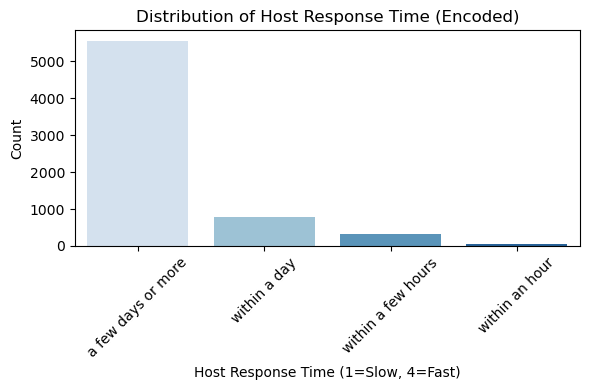

In [489]:
import matplotlib.pyplot as plt
import seaborn as sns

if 'host_response_time' in df.columns:
    plt.figure(figsize=(6, 4))
    sns.countplot(data=df, x='host_response_time', palette='Blues')

    plt.title('Distribution of Host Response Time (Encoded)')
    plt.xlabel('Host Response Time (1=Slow, 4=Fast)')
    plt.ylabel('Count')
    plt.xticks(ticks=[0, 1, 2, 3], labels=['a few days or more', 'within a day', 'within a few hours', 'within an hour'], rotation=45)
    plt.tight_layout()
    plt.show()


In [490]:
# 8.9 Host response time mapping
if 'host_response_time' in df.columns and df['host_response_time'].dtype == 'object':
    response_time_mapping = {
        'within an hour': 4,      # Fast response (highest score)
        'within a few hours': 3,  # Good response
        'within a day': 2,        # Moderate response
        'a few days or more': 1   # Slow response (lowest score)
    }
    df['host_response_time'] = df['host_response_time'].map(response_time_mapping)


In [491]:
# 8.10 City name standardization
if 'city' in df.columns:
    print("Standardizing city names...")
    df['city'] = df['city'].str.lower().str.strip()

    # Group common variations of San Diego
    san_diego_patterns = ['san diego', 'san deigo', 'san diego,', 'gas lamp']
    df['is_san_diego'] = df['city'].apply(
        lambda x: 1 if any(pattern in str(x).lower() for pattern in san_diego_patterns) else 0
    )

    # Group La Jolla
    df['is_la_jolla'] = df['city'].apply(
        lambda x: 1 if 'la jolla' in str(x).lower() else 0
    )

    # Drop original city column
    df = df.drop('city', axis=1)


Standardizing city names...


In [492]:
cat_col = df.select_dtypes(include='object').columns
cat_col

Index(['host_name', 'host_location', 'host_neighbourhood', 'street',
       'neighbourhood', 'neighbourhood_cleansed', 'state', 'zipcode', 'market',
       'smart_location', 'country_code', 'country', 'cancellation_policy',
       'host_sentiment_label'],
      dtype='object')

In [493]:
df['cancellation_policy'].unique()

array(['strict_14_with_grace_period', 'moderate', 'flexible',
       'super_strict_60', 'strict', 'super_strict_30'], dtype=object)

In [494]:
# Price-related ratios
if all(col in df.columns for col in ['price_per_stay', 'nightly_price', 'cleaning_fee']):
    df['price_to_nightly_ratio'] = df['price_per_stay'] / (df['nightly_price'] + 0.001)  # Avoid division by zero
    df['cleaning_to_nightly_ratio'] = df['cleaning_fee'] / (df['nightly_price'] + 0.001)

# Guest-related ratios
if all(col in df.columns for col in ['accommodates', 'guests_included', 'bedrooms', 'bathrooms']):
    df['price_per_guest'] = df['nightly_price'] / (df['accommodates'] + 0.001)
    df['beds_per_guest'] = df['beds'] / (df['accommodates'] + 0.001)
    df['baths_per_guest'] = df['bathrooms'] / (df['accommodates'] + 0.001)
    df['guests_to_bedrooms'] = df['accommodates'] / (df['bedrooms'] + 0.001)

# Reviews-related ratios
if all(col in df.columns for col in ['number_of_reviews', 'number_of_stays']):
    df['review_rate'] = df['number_of_reviews'] / (df['number_of_stays'] + 0.001)

# 9. Remove high cardinality categorical columns
high_cardinality_cols = ['host_location', 'host_neighbourhood', 'country', 'city', 'street',
                         'neighbourhood', 'neighbourhood_cleansed', 'zipcode', 'market', 'smart_location']

for col in high_cardinality_cols:
    if col in df.columns:
        df = df.drop(col, axis=1)

# Other Encoding

In [ ]:
# 8.11 Cleanup remaining categorical columns
cat_cols = df.select_dtypes(include=['object']).columns

# Check nunique values for each categorical column
cat_nunique = {col: df[col].nunique() for col in cat_cols}
print("\nUnique values for categorical columns:")
for col, nunique in cat_nunique.items():
    print(f"{col}: {nunique}")

# For high cardinality columns, use target encoding or frequency encoding
high_card_cols = [col for col, nunique in cat_nunique.items() if nunique > 10]

for col in high_card_cols:
    if col in location_cols + host_cols:
        # Target encoding
        target_means = df.groupby(col)[target_col].mean()
        df[f'{col}_target_encoded'] = df[col].map(target_means).fillna(0)
        if col == 'host_name': #as same as classif notebook
          with open('host_name_target_means_reg.pkl', 'wb') as file:
            pickle.dump(target_means, file)
           

        # Frequency encoding
        value_counts = df[col].value_counts(normalize=True)
        df[f'{col}_freq_encoded'] = df[col].map(value_counts).fillna(0)
        if col == 'host_name': #as same as classif notebook
          with open('host_name_value_counts.pkl', 'wb') as file:
            pickle.dump(value_counts, file)
          
        # Drop original column
        df = df.drop(col, axis=1)
    else:
        # If it's not location or host column, use one-hot encoding for low cardinality
        # or LabelEncoder for high cardinality
        if df[col].nunique() <= 10:
            df = pd.get_dummies(df, columns=[col], prefix=col.split('_')[0], drop_first=True)
        else:
            le = LabelEncoder()
            df[col] = le.fit_transform(df[col])

# For remaining object columns, apply label encoding
cat_col= df.select_dtypes(include=['object']).columns
print(cat_col)
for col in cat_col:
    le = LabelEncoder()
    df[col] = le.fit_transform(df[col])
with open('LabelEncoder_for_object_columns_reg.pkl', 'wb') as file:
    pickle.dump(le, file)


Unique values for categorical columns:
Index([], dtype='object')


# Feature Selection "K best"

In [496]:
# # 9. Feature Selection
# print("\nPerforming feature selection...")

# X = df.drop(columns=[target_col])
# y = df[target_col]

# # 9.1 Check for multicollinearity
# numeric_cols = X.select_dtypes(include=['number']).columns
# corr_matrix = X[numeric_cols].corr().abs()

# # Find highly correlated features (correlation > 0.9)
# high_corr = (corr_matrix >= 0.9) & (corr_matrix < 1.0)
# high_corr_features = []

# for i in range(len(corr_matrix.columns)):
#     for j in range(i):
#         if high_corr.iloc[i, j]:
#             colname = corr_matrix.columns[i]
#             high_corr_features.append(colname)

# print(f"High correlation features: {high_corr_features}")

# # 9.2 Feature importance using mutual information
# num_features = min(30, X.shape[1])  # Select top 30 features or all if less

# # Select the best features
# selector = SelectKBest(mutual_info_regression, k=num_features)
# X_selected = selector.fit_transform(X, y)

# # Get selected feature names
# selected_indices = selector.get_support(indices=True)
# selected_features = X.columns[selected_indices]

# print(f"Selected {len(selected_features)} features: {', '.join(selected_features[:10])}...")

# # Create dataset with selected features
# X_best = X[selected_features]



In [497]:
# 9. Feature Selection
print("\nPerforming feature selection...")
X = df.drop(columns=[target_col])
y = df[target_col]

# Separate numeric and categorical features
numeric_cols = X.select_dtypes(include=['number']).columns
categorical_cols = X.select_dtypes(exclude=['number']).columns

print(f"Numeric features: {len(numeric_cols)}")
print(f"Categorical features: {len(categorical_cols)}")

# 9.1 Check for multicollinearity (only on numeric features)
corr_matrix = X[numeric_cols].corr().abs()
# Find highly correlated features (correlation > 0.9)
high_corr = (corr_matrix >= 0.9) & (corr_matrix < 1.0)
high_corr_features = []
for i in range(len(corr_matrix.columns)):
    for j in range(i):
        if high_corr.iloc[i, j]:
            colname = corr_matrix.columns[i]
            high_corr_features.append(colname)
print(f"High correlation features: {high_corr_features}")

# 9.2 Encode categorical features
from sklearn.preprocessing import OneHotEncoder

# One-hot encode categorical features
if len(categorical_cols) > 0:
    encoder = OneHotEncoder(sparse_output=False, drop='first')
    encoded_cats = encoder.fit_transform(X[categorical_cols])

    # Create DataFrame with encoded categorical features
    encoded_cat_df = pd.DataFrame(
        encoded_cats,
        columns=encoder.get_feature_names_out(categorical_cols),
        index=X.index
    )

    # Combine numeric and encoded categorical features
    X_processed = pd.concat([X[numeric_cols], encoded_cat_df], axis=1)
else:
    X_processed = X[numeric_cols].copy()

# 9.3 Feature importance using mutual information
num_features = min(30, X_processed.shape[1])  # Select top 30 features or all if less

# Select the best features
selector = SelectKBest(mutual_info_regression, k=num_features)
X_selected = selector.fit_transform(X_processed, y)

# Get selected feature names
selected_indices = selector.get_support(indices=True)
selected_features = X_processed.columns[selected_indices]
print(f"Selected {len(selected_features)} features: {', '.join(selected_features[:30])}...")

with open('selected_features_reg.pkl', 'wb') as file:
    pickle.dump(selected_features, file)

# Create dataset with selected features
X_best = X_processed[selected_features]


Performing feature selection...
Numeric features: 342
Categorical features: 7
High correlation features: ['number_of_stays', 'host_experience', 'stay_range', 'host_avg_price', 'host_avg_response_rate', 'host_avg_reviews', 'host_avg_reviews', 'host_total_listings_count_log', 'reviews_per_stay', 'reviews_per_stay', 'total_guests_capacity', 'rooms_capacity', 'rooms_capacity', 'price_per_person', 'price_diff', 'price_diff', 'superhost_reviews_interaction', 'superhost_price_interaction', 'host_scale', 'host_scale', 'reviews_per_listing', 'host_since_year', 'first_review_year', 'last_review_year', 'name_tfidf_san', 'summary_tfidf_san', 'space_tfidf_minute', 'space_tfidf_san', 'description_tfidf_san', 'neighborhood_overview_tfidf_san', 'notes_tfidf_individually', 'notes_tfidf_model', 'notes_tfidf_model', 'notes_tfidf_photos', 'notes_tfidf_photos', 'notes_tfidf_photos', 'notes_tfidf_pictured', 'notes_tfidf_pictured', 'notes_tfidf_pictured', 'notes_tfidf_pictured', 'notes_tfidf_repeat', 'notes

In [498]:
# Select columns with boolean type
bool_cols = df.select_dtypes(include=['bool']).columns

# Convert boolean columns to integers (0 for False, 1 for True)
df[bool_cols] = df[bool_cols].astype(int)


In [499]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6724 entries, 0 to 6723
Columns: 350 entries, host_response_time to host_name_freq_encoded
dtypes: float64(295), int32(33), int64(22)
memory usage: 17.1 MB


# Feature Scaling

In [500]:
# 10. Data Scaling
print("\nScaling features...")
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_best)
X_scaled_df = pd.DataFrame(X_scaled, columns=selected_features)

with open('scaleFeatures_reg.pkl', 'wb') as file:
    pickle.dump(scaler, file)

# 11. Train-Test Split
X_train, X_test, y_train, y_test = train_test_split(
    X_scaled_df, y, test_size=0.2, random_state=RANDOM_STATE
)

print(f"Training set size: {X_train.shape}")
print(f"Test set size: {X_test.shape}")

# 12. Model Selection and Training
print("\nTraining models...")



Scaling features...
Training set size: (5379, 30)
Test set size: (1345, 30)

Training models...


# Models

## Linear Regression Model

Linear Regression model R²: 0.4612
Linear Regression model MAE: 2.2568
Linear Regression model MSE: 9.9941
Linear Regression model RMSE: 3.1613


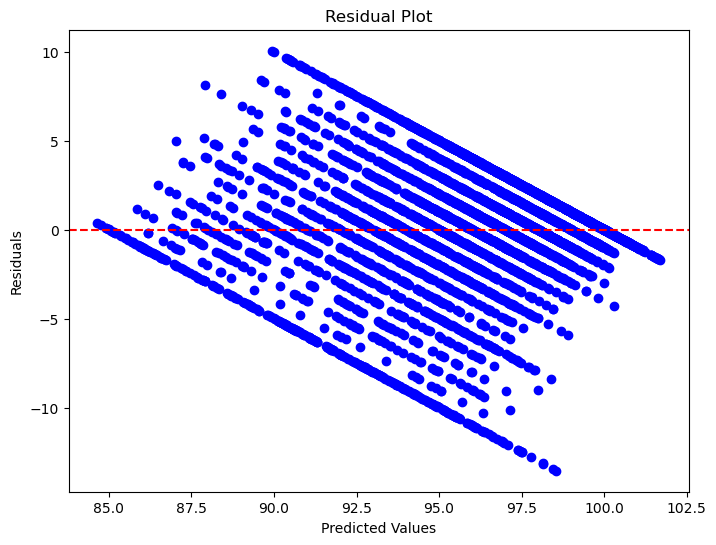

In [501]:
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import cross_val_score
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error

# Create a Linear Regression model
lin_reg = LinearRegression()

# Perform cross-validation with R² score
cv_scores = cross_val_score(lin_reg, X_train, y_train, cv=5, scoring='r2')

mean_r2_LR = cv_scores.mean()

lin_reg.fit(X_train, y_train)

y_pred_test = lin_reg.predict(X_test)


r2_LR = r2_score(y_test, y_pred_test)
mse = mean_squared_error(y_test, y_pred_test)
mae = mean_absolute_error(y_test, y_pred_test)
rmse = np.sqrt(mse)

# Print the evaluation metrics
print(f"Linear Regression model R²: {mean_r2_LR:.4f}")
print(f"Linear Regression model MAE: {mae:.4f}")
print(f"Linear Regression model MSE: {mse:.4f}")
print(f"Linear Regression model RMSE: {rmse:.4f}")
with open('linearRegression.pkl', 'wb') as file:
    pickle.dump(lin_reg, file)

residuals = y_train - lin_reg.predict(X_train)

plt.figure(figsize=(8, 6))
plt.scatter(lin_reg.predict(X_train), residuals, color='blue')
plt.axhline(y=0, color='red', linestyle='--')
plt.title('Residual Plot')
plt.xlabel('Predicted Values')
plt.ylabel('Residuals')
plt.show()



## Hyber Regression Model

In [502]:
from sklearn.linear_model import HuberRegressor
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error

huber = HuberRegressor()

huber.fit(X_train, y_train)

y_pred_huber = huber.predict(X_test)

with open('huberModel.pkl', 'wb') as file:
    pickle.dump(huber, file)

r2_hyper = r2_score(y_test, y_pred_huber)
print("Huber Regression R²:",r2_hyper )
print("Huber Regression MAE:", mean_absolute_error(y_test, y_pred_huber))
print("Huber Regression RMSE:", mean_squared_error(y_test, y_pred_huber))#, squared=False


Huber Regression R²: 0.43216892506038873
Huber Regression MAE: 2.193932798495358
Huber Regression RMSE: 9.976074674344472


C:\Users\GHOST\AppData\Roaming\Python\Python311\site-packages\sklearn\linear_model\_huber.py:343: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html



## Log Transformed Regression Model

In [503]:
import numpy as np

y_train_log = np.log(y_train)
y_test_log = np.log(y_test)

lin_reg.fit(X_train, y_train_log)
y_pred_log = lin_reg.predict(X_test)

with open('linearLogTransformation.pkl', 'wb') as file:
    pickle.dump(lin_reg, file)

y_pred_exp = np.exp(y_pred_log)

print("Log-Transformed Regression R²:", r2_score(y_test, y_pred_exp))


Log-Transformed Regression R²: 0.4255520904745479


## 6 Regression Models

C:\Users\GHOST\AppData\Roaming\Python\Python311\site-packages\sklearn\linear_model\_huber.py:343: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html



Linear = MSE: 10.4024, R²: 0.4647
Log Transform = MSE: 10.4335, R²: 0.4631
Sqrt Transform = MSE: 10.4151, R²: 0.4641
Polynomial = MSE: 9.4542, R²: 0.5135
Huber = MSE: 10.7735, R²: 0.4456
RANSAC = MSE: 10.4038, R²: 0.4647


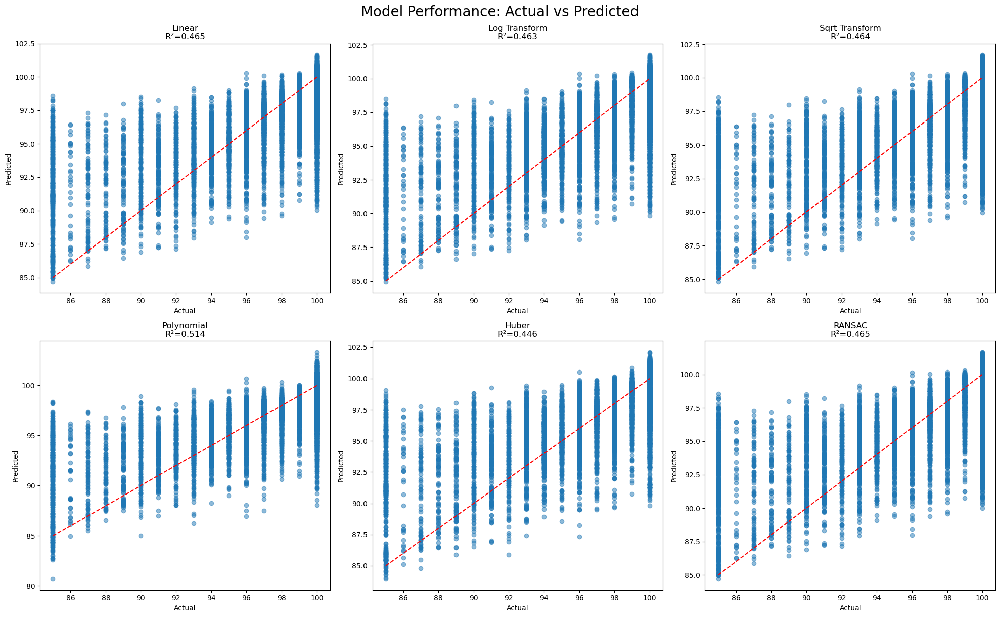


Best Model: Polynomial with R²: 0.5135


In [504]:
from sklearn.linear_model import LinearRegression, HuberRegressor, RANSACRegressor
from sklearn.preprocessing import PolynomialFeatures
from sklearn.metrics import mean_squared_error, r2_score
import matplotlib.pyplot as plt
import numpy as np

# Transform y to different scales
y_log = np.log1p(y)
y_sqrt = np.sqrt(y)

# Polynomial features
poly = PolynomialFeatures(2, include_bias=False)
X_poly = poly.fit_transform(X_best)
with open('X_polyTransform.pkl', 'wb') as file:
    pickle.dump(poly, file)

# Models
model_original = LinearRegression().fit(X_best, y)
model_log = LinearRegression().fit(X_best, y_log)
model_sqrt = LinearRegression().fit(X_best, y_sqrt)
model_poly = LinearRegression().fit(X_poly, y)

# Improved HuberRegressor
model_robust = HuberRegressor(epsilon=1.5, alpha=0.0001, max_iter=1000).fit(X_best, y)

# Improved RANSACRegressor without base_estimator
ransac = RANSACRegressor(
    max_trials=500,
    residual_threshold=50.0,
    random_state=42
)
model_ransac = ransac.fit(X_best, y)

with open('huberModel1.pkl', 'wb') as file:
    pickle.dump(huber, file)

# Store models
models = {
    'Linear': model_original,
    'Log Transform': model_log,
    'Sqrt Transform': model_sqrt,
    'Polynomial': model_poly,
    'Huber': model_robust,
    'RANSAC': model_ransac
}
with open('LinearOriginal.pkl', 'wb') as file:
    pickle.dump(model_original, file)

with open('Log Transform.pkl', 'wb') as file:
    pickle.dump(model_log, file)

with open('Sqrt Transform.pkl', 'wb') as file:
    pickle.dump(model_sqrt, file)

with open('Polynomial.pkl', 'wb') as file:
    pickle.dump(model_poly, file)

with open('HuberModel2.pkl', 'wb') as file:
    pickle.dump(model_robust, file)

with open('RANSAC.pkl', 'wb') as file:
    pickle.dump(model_ransac, file)

# Initialize variable to store the best R² score
best_r2_score = -np.inf
best_model_name = ''

# Plotting setup
plt.figure(figsize=(20, 12))
plot_idx = 1

for name, model in models.items():
    if name in ['Log Transform', 'Sqrt Transform']:
        if name == 'Log Transform':
            preds = np.expm1(model.predict(X_best))
        else:
            preds = model.predict(X_best) ** 2
    else:
        if name == 'Polynomial':
            preds = model.predict(X_poly)
        else:
            preds = model.predict(X_best)

    mse = mean_squared_error(y, preds)
    r2 = r2_score(y, preds)

    print(f"{name} = MSE: {mse:.4f}, R²: {r2:.4f}")

    if r2 > best_r2_score:
        best_r2_score = r2
        best_model_name = name

    # Scatter plot for actual vs predicted
    plt.subplot(2, 3, plot_idx)
    plt.scatter(y, preds, alpha=0.5)
    plt.plot([y.min(), y.max()], [y.min(), y.max()], 'r--')
    plt.title(f"{name}\nR²={r2:.3f}")
    plt.xlabel("Actual")
    plt.ylabel("Predicted")
    plot_idx += 1

plt.tight_layout()
plt.suptitle('Model Performance: Actual vs Predicted', fontsize=20, y=1.02)
plt.show()

# Best model
print(f"\nBest Model: {best_model_name} with R²: {best_r2_score:.4f}")


In [505]:

# Define the parameter grid for Ridge and Lasso
param_grid_ridge = {'alpha': [0.1, 1, 10, 100]}
param_grid_lasso = {'alpha': [0.01, 0.1, 1, 10]}

# Ridge GridSearch
ridge_search = GridSearchCV(Ridge(), param_grid_ridge, cv=10, scoring='r2')
ridge_search.fit(X_train, y_train)
best_ridge = ridge_search.best_estimator_

# Lasso GridSearch
lasso_search = GridSearchCV(Lasso(), param_grid_lasso, cv=10, scoring='r2')
lasso_search.fit(X_train, y_train)
best_lasso = lasso_search.best_estimator_

# Evaluate the best Ridge model
predict_best_ridge = best_ridge.predict(X_test)

with open('predict_best_ridge.pkl', 'wb') as file:
    pickle.dump(best_ridge, file)


r2_best_ridge = r2_score(y_test, predict_best_ridge)
mae_best_ridge = mean_absolute_error(y_test, predict_best_ridge)

# Evaluate the best Lasso model
predict_best_lasso = best_lasso.predict(X_test)

with open('predict_best_lasso.pkl', 'wb') as file:
    pickle.dump(best_lasso, file)

r2_best_lasso = r2_score(y_test, predict_best_lasso)
mae_best_lasso = mean_absolute_error(y_test, predict_best_lasso)

# Print best hyperparameters and evaluation metrics
print("Best Ridge Hyperparameters:", ridge_search.best_params_)
print("Best Lasso Hyperparameters:", lasso_search.best_params_)
print(f"Best Ridge R²: {r2_best_ridge:.4f}, MAE: {mae_best_ridge:.4f}")
print(f"Best Lasso R²: {r2_best_lasso:.4f}, MAE: {mae_best_lasso:.4f}")


Best Ridge Hyperparameters: {'alpha': 0.1}
Best Lasso Hyperparameters: {'alpha': 0.01}
Best Ridge R²: 0.4306, MAE: 2.2576
Best Lasso R²: 0.4301, MAE: 2.2523


## ElasticNet Model





In [506]:
from sklearn.linear_model import ElasticNet
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error

elastic_net_model = ElasticNet(alpha=0.001, l1_ratio=0.2)
elastic_net_model.fit(X_train, y_train)

predict_en = elastic_net_model.predict(X_test)

r2_en = r2_score(y_test, predict_en)
mse_en = mean_squared_error(y_test, predict_en)
mae_en = mean_absolute_error(y_test, predict_en)


with open('elastic_net_model.pkl', 'wb') as file:
    pickle.dump(elastic_net_model, file)

print("ElasticNet model R²: {:.4f}".format(r2_en))
print("ElasticNet model MAE: {:.4f}".format(mae_en))


ElasticNet model R²: 0.4327
ElasticNet model MAE: 2.2555


C:\Users\GHOST\AppData\Roaming\Python\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:695: ConvergenceWarning:

Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.733e+03, tolerance: 1.069e+01



## Many Models

Combined model test R²: 0.3874
Combined model test MSE: 10.7623
Base model test R²: 0.4311
Base model test MSE: 9.9941


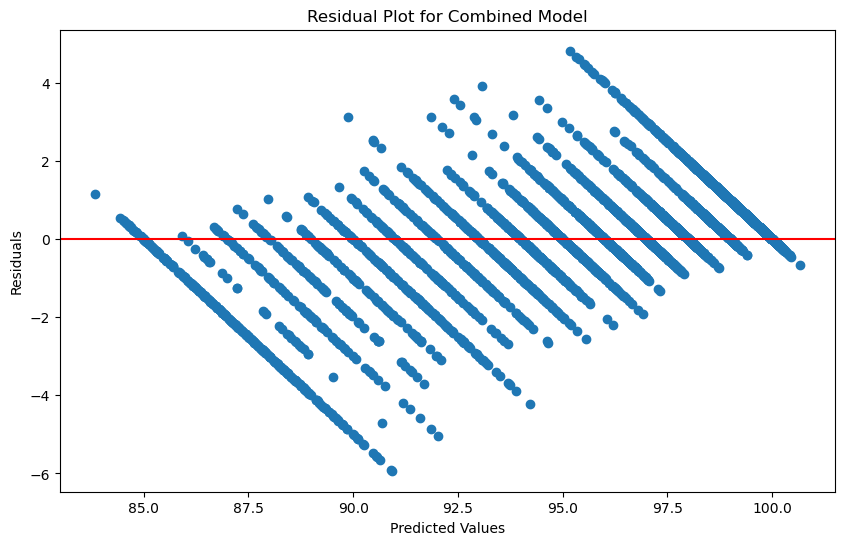

In [507]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.model_selection import train_test_split

# 1. Visualize feature relationships to identify non-linearities
def check_feature_relationships(X, y):
    for i, col in enumerate(X.columns):
        plt.figure(figsize=(8, 6))
        plt.scatter(X[col], y)
        plt.title(f'Relationship between {col} and target')
        plt.xlabel(col)
        plt.ylabel('Target')
        plt.show()

# Assuming you have a DataFrame with column names
# check_feature_relationships(X_df, y)

# 2. Residual correction model approach
# First, split data to avoid overfitting
X_train, X_test, y_train, y_test = train_test_split(X_best, y, test_size=0.2, random_state=42)

# Train base model
base_model = LinearRegression()
base_model.fit(X_train, y_train)

# Get residuals from training data
y_pred_train = base_model.predict(X_train)
residuals_train = y_train - y_pred_train

# Train a second model to predict the residuals
residual_model = RandomForestRegressor(n_estimators=100, random_state=42)
residual_model.fit(X_train, residuals_train)

# For new predictions, combine both models
def predict_with_residual_correction(X_new, base_model, residual_model):
    base_pred = base_model.predict(X_new)
    residual_pred = residual_model.predict(X_new)
    return base_pred + residual_pred

# Evaluate on test set
y_pred_test = predict_with_residual_correction(X_test, base_model, residual_model)
print(f"Combined model test R²: {r2_score(y_test, y_pred_test):.4f}")
print(f"Combined model test MSE: {mean_squared_error(y_test, y_pred_test):.4f}")

# Compare with base model alone
base_pred_test = base_model.predict(X_test)
print(f"Base model test R²: {r2_score(y_test, base_pred_test):.4f}")
print(f"Base model test MSE: {mean_squared_error(y_test, base_pred_test):.4f}")

# 3. Plot new residuals to check if pattern is reduced
plt.figure(figsize=(10, 6))
combined_pred_train = predict_with_residual_correction(X_train, base_model, residual_model)
combined_residuals = y_train - combined_pred_train
plt.scatter(combined_pred_train, combined_residuals)
plt.axhline(y=0, color='r', linestyle='-')
plt.title('Residual Plot for Combined Model')
plt.xlabel('Predicted Values')
plt.ylabel('Residuals')
plt.show()

# 4. Feature transformations based on observed patterns
def create_transformed_features(X):
    X_transformed = X.copy()

    # Add squared terms
    for col in X.columns:
        X_transformed[f'{col}_squared'] = X[col]**2

    # Add interaction terms (for important features)
    for i, col1 in enumerate(X.columns):
        for j, col2 in enumerate(X.columns):
            if i < j:  # To avoid duplicates
                X_transformed[f'{col1}_{col2}_interaction'] = X[col1] * X[col2]

    # Add other transformations as needed
    for col in X.columns:
        X_transformed[f'{col}_log'] = np.log1p(X[col] - X[col].min() + 1)  # log(x+1) after ensuring positivity
        X_transformed[f'{col}_sqrt'] = np.sqrt(X[col] - X[col].min())  # sqrt after ensuring positivity

    return X_transformed

# If X_best is a DataFrame:
# X_transformed = create_transformed_features(X_best)
# model_transformed = LinearRegression().fit(X_transformed, y)
# y_pred_transformed = model_transformed.predict(X_transformed)
# print(f"Transformed features R²: {r2_score(y, y_pred_transformed):.4f}")

# 5. Non-parametric approach that can handle non-linearities directly
def train_advanced_model():
    from sklearn.ensemble import GradientBoostingRegressor
    from sklearn.model_selection import GridSearchCV

    param_grid = {
        'n_estimators': [100, 200],
        'learning_rate': [0.05, 0.1],
        'max_depth': [3, 5],
        'min_samples_split': [2, 5]
    }

    gb = GradientBoostingRegressor(random_state=42)
    grid_search = GridSearchCV(gb, param_grid, cv=5, scoring='r2')
    grid_search.fit(X_train, y_train)

    print(f"Best parameters: {grid_search.best_params_}")
    best_gb = grid_search.best_estimator_
    y_pred_gb = best_gb.predict(X_test)
    print(f"GBM test R²: {r2_score(y_test, y_pred_gb):.4f}")

    # Plot residuals for gradient boosting model
    y_pred_train_gb = best_gb.predict(X_train)
    residuals_gb = y_train - y_pred_train_gb
    plt.figure(figsize=(10, 6))
    plt.scatter(y_pred_train_gb, residuals_gb)
    plt.axhline(y=0, color='r', linestyle='-')
    plt.title('Residual Plot for Gradient Boosting Model')
    plt.xlabel('Predicted Values')
    plt.ylabel('Residuals')
    plt.show()

    return best_gb

# advanced_model = train_advanced_model()

## Polynomial Regression Model

Polynomial Regression model R²: 0.4292
Polynomial Regression model MAE: 2.3420


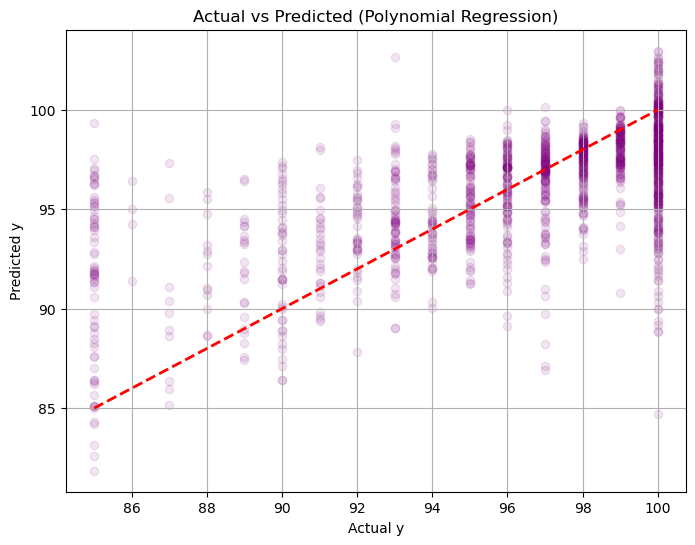

In [508]:
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import PolynomialFeatures
from sklearn.model_selection import cross_val_score
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
import matplotlib.pyplot as plt

poly = PolynomialFeatures(degree=2)
X_train_poly = poly.fit_transform(X_train)
X_test_poly = poly.transform(X_test)

poly_reg = LinearRegression()
poly_reg.fit(X_train_poly, y_train)

cv_scores_poly = cross_val_score(poly_reg, X_train_poly, y_train, cv=10, scoring='r2')

mean_r2_poly = cv_scores_poly.mean()

y_pred_poly = poly_reg.predict(X_test_poly)


with open('poly_fetures.pkl', 'wb') as file:
    pickle.dump(poly, file)

with open('poly_reg.pkl', 'wb') as file:
    pickle.dump(poly_reg, file)

r2_poly = r2_score(y_test, y_pred_poly)
mse_poly = mean_squared_error(y_test, y_pred_poly)
mae_poly = mean_absolute_error(y_test, y_pred_poly)

print(f"Polynomial Regression model R²: {mean_r2_poly:.4f}")
print(f"Polynomial Regression model MAE: {mae_poly:.4f}")


plt.figure(figsize=(8, 6))
plt.scatter(y_test, y_pred_poly, alpha=0.1, color='purple')
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--', lw=2)
plt.xlabel('Actual y')
plt.ylabel('Predicted y')
plt.title('Actual vs Predicted (Polynomial Regression)')
plt.grid(True)
plt.show()


## KNN Model with best K

k=4, mean r2=0.3177
k=6, mean r2=0.3552
k=8, mean r2=0.3765
k=10, mean r2=0.3854
k=12, mean r2=0.3922
k=14, mean r2=0.3977
k=16, mean r2=0.3995
k=18, mean r2=0.3994
k=20, mean r2=0.3994
k=22, mean r2=0.3991
k=24, mean r2=0.3973
k=26, mean r2=0.3962
k=28, mean r2=0.3966
k=30, mean r2=0.3950
k=32, mean r2=0.3946
k=34, mean r2=0.3947
k=36, mean r2=0.3936
k=38, mean r2=0.3932
k=40, mean r2=0.3917
k=42, mean r2=0.3909


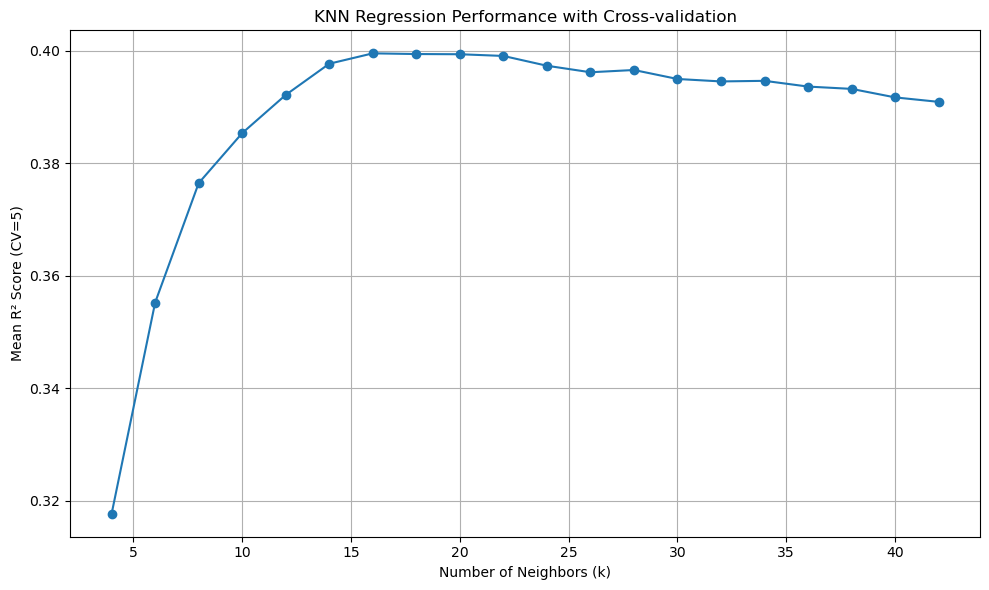


Best number of neighbors (k): 16 with R² = 0.3995


In [509]:
from sklearn.neighbors import KNeighborsRegressor
from sklearn.metrics import mean_squared_error, r2_score
import numpy as np

wss = []

k_values = range(4, 44, 2)
mean_r2_scores = []

for k in k_values:
    knn = KNeighborsRegressor(n_neighbors=k, weights='distance')
    scores = cross_val_score(knn, X_scaled_df, y, cv=10, scoring='r2')
    mean_r2 = scores.mean()
    mean_r2_scores.append(mean_r2)
    print(f"k={k}, mean r2={mean_r2:.4f}")

# لو حابب ترسم الأداء حسب k
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6))
plt.plot(k_values, mean_r2_scores, marker='o', linestyle='-')
plt.xlabel('Number of Neighbors (k)')
plt.ylabel('Mean R² Score (CV=5)')
plt.title('KNN Regression Performance with Cross-validation')
plt.grid(True)
plt.tight_layout()
plt.show()

# Find best k
best_k_index = np.argmax(mean_r2_scores)
best_k = k_values[best_k_index]
best_r2 = mean_r2_scores[best_k_index]

print(f"\nBest number of neighbors (k): {best_k} with R² = {best_r2:.4f}")

## Decision Tree Model

In [510]:
from sklearn.tree import DecisionTreeRegressor
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

# Define the hyperparameter grid
param_grid = {
    'max_depth': [2, 5, 10, None],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4]
}

# Create a Decision Tree Regressor
DT_model = DecisionTreeRegressor(random_state=0)

# Create a GridSearchCV object
grid_search = GridSearchCV(estimator=DT_model, param_grid=param_grid, cv=5, scoring='r2')

# Perform grid search cross-validation
grid_search.fit(X_train, y_train)

# Get the best hyperparameters
best_params = grid_search.best_params_
print("Best Hyperparameters:", best_params)

# Get the best model
best_DT_model = grid_search.best_estimator_

with open('best_DT_model.pkl', 'wb') as file:
    pickle.dump(best_DT_model, file)

# Make predictions on the test set
y_pred = best_DT_model.predict(X_test)

# Evaluate the model
mse = mean_squared_error(y_test, y_pred)
mae = mean_absolute_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print(f"Mean Squared Error (MSE): {mse:.4f}")
print(f"Mean Absolute Error (MAE): {mae:.4f}")
print(f"R² Score: {r2:.4f}")


Best Hyperparameters: {'max_depth': 5, 'min_samples_leaf': 2, 'min_samples_split': 10}
Mean Squared Error (MSE): 10.9824
Mean Absolute Error (MAE): 2.2493
R² Score: 0.3749


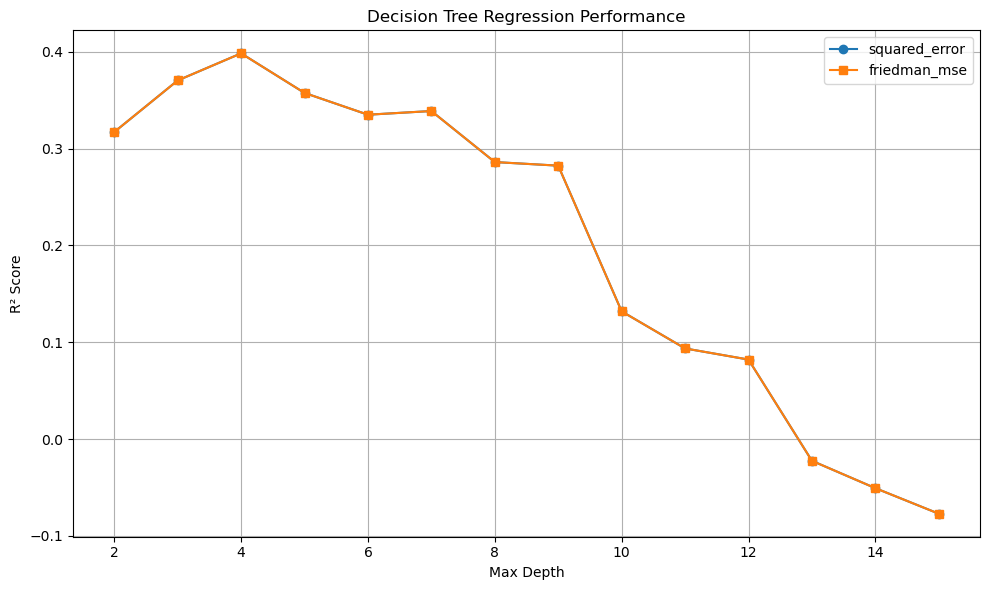

In [511]:
from sklearn.tree import DecisionTreeRegressor
from sklearn.metrics import r2_score
import matplotlib.pyplot as plt

r2_scores_se = []
r2_scores_fmse = []

for i in range(2, 16):
    # Using 'squared_error' criterion
    dtr1 = DecisionTreeRegressor(max_depth=i, criterion="squared_error", random_state=0)
    dtr1.fit(X_train, y_train)
    y_pred1 = dtr1.predict(X_test)
    r2_scores_se.append(r2_score(y_test, y_pred1))

    # Using 'friedman_mse' criterion
    dtr2 = DecisionTreeRegressor(max_depth=i, criterion="friedman_mse", random_state=0)
    dtr2.fit(X_train, y_train)
    y_pred2 = dtr2.predict(X_test)
    r2_scores_fmse.append(r2_score(y_test, y_pred2))

# Plotting the results
plt.figure(figsize=(10, 6))
plt.plot(range(2, 16), r2_scores_se, label="squared_error", marker='o')
plt.plot(range(2, 16), r2_scores_fmse, label="friedman_mse", marker='s')
plt.xlabel("Max Depth")
plt.ylabel("R² Score")
plt.title("Decision Tree Regression Performance")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


Decision_Tree R2_Train: 0.4610
Decision_Tree R2_Test: 0.3984
cv R² Score: 0.4612


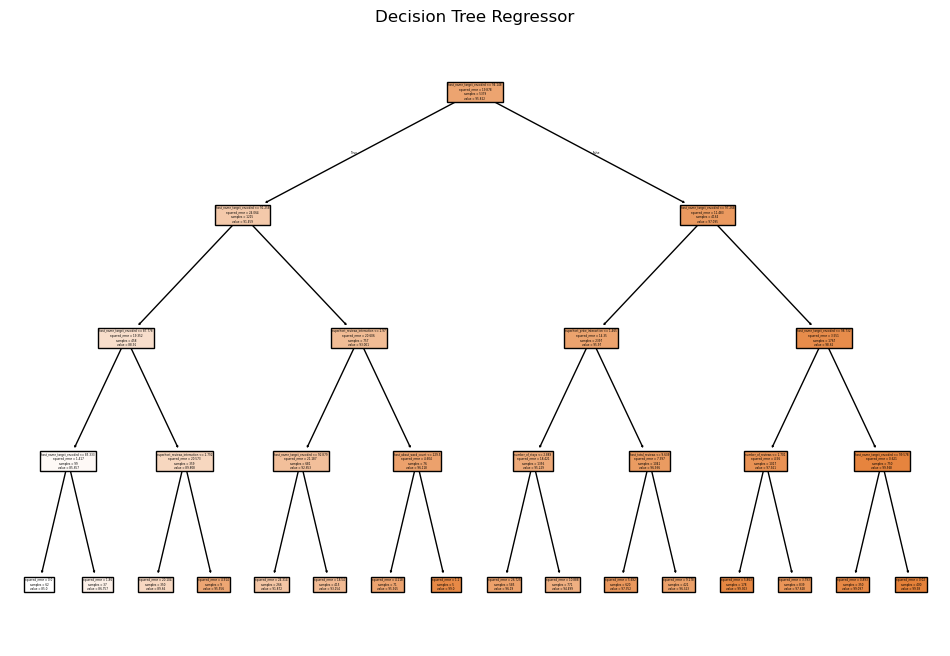

In [512]:
from sklearn.tree import DecisionTreeRegressor
from sklearn.metrics import r2_score
from sklearn.model_selection import cross_val_score
import matplotlib.pyplot as plt
from sklearn import tree

# Initialize the model
reg = DecisionTreeRegressor(criterion='squared_error', max_depth=4, random_state=0)

# Fit the model
reg.fit(X_train, y_train)

# Predictions
y_pred_train = reg.predict(X_train)
y_pred_test = reg.predict(X_test)


# R² Scores
print('Decision_Tree R2_Train: {0:0.4f}'.format(r2_score(y_train, y_pred_train)))
print('Decision_Tree R2_Test: {0:0.4f}'.format(r2_score(y_test, y_pred_test)))
# R² Scores
cv_r2_DT = cross_val_score(reg, X_train, y_train, cv=10, scoring='r2')
print('cv R² Score: {:.4f}'.format(cv_scores.mean()))
with open('DecisionTreeRegressor.pkl', 'wb') as file:
    pickle.dump(reg, file)
# Plotting the Decision Tree
plt.figure(figsize=(12, 8))
tree.plot_tree(reg, filled=True, feature_names=list(X_train.columns))
plt.title("Decision Tree Regressor")
plt.show()


## Random Forest with Feature Selection

Random Forest model (Important Features) R²: 0.3754
Random Forest model (Important Features) MAE: 2.2107
Random Forest model (Important Features) MSE: 10.9728
Cross-validation R² scores: [0.46292225 0.42931452 0.41116407 0.45760958 0.45026174 0.44395783
 0.39944757 0.50938524 0.46282325 0.47989668]


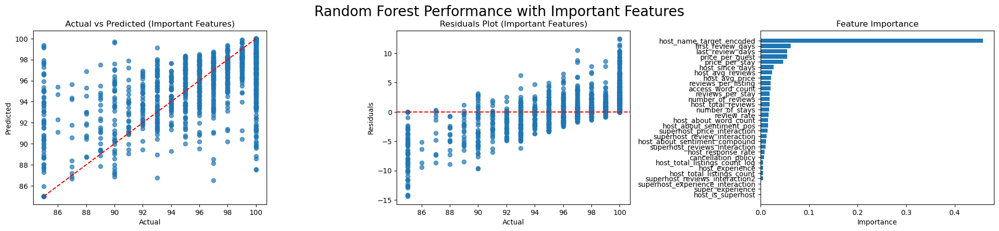

In [513]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error

# Initialize the Random Forest Regressor
RF = RandomForestRegressor(n_estimators=100, random_state=0)

# Fit the model
RF.fit(X_train, y_train)

# Get the feature importance
feature_importance = RF.feature_importances_

# Get the important features based on feature importance (e.g., top 20 features)
important_features = X_train.columns[feature_importance.argsort()][-30:]

# Create new training and testing data based on the important features
X_train_important = X_train[important_features]
X_test_important = X_test[important_features]

# Re-train the model on the new data
RF.fit(X_train_important, y_train)

with open('RandomForestRegressor.pkl', 'wb') as file:
    pickle.dump(RF, file)

# Make predictions
predict_RF_important = RF.predict(X_test_important)

# Evaluate the model using R², MSE, and MAE
r2_RF = r2_score(y_test, predict_RF_important)
mse = mean_squared_error(y_test, predict_RF_important)
mae = mean_absolute_error(y_test, predict_RF_important)

# Print the evaluation metrics
print(f"Random Forest model (Important Features) R²: {r2_RF:.4f}")
print(f"Random Forest model (Important Features) MAE: {mae:.4f}")
print(f"Random Forest model (Important Features) MSE: {mse:.4f}")

cv_r2_scores = cross_val_score(RF, X_train_important, y_train, cv=10, scoring='r2')
# Print the CV R² scores
print(f"Cross-validation R² scores: {cv_r2_scores}")

# Visualizations
plt.figure(figsize=(20, 8))

# 1. Actual vs Predicted for the important features model
plt.subplot(2, 3, 1)
plt.scatter(y_test, predict_RF_important, alpha=0.7)
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--')
plt.title("Actual vs Predicted (Important Features)")
plt.xlabel("Actual")
plt.ylabel("Predicted")

# 2. Residuals Plot for the important features model
plt.subplot(2, 3, 2)
residuals = y_test - predict_RF_important
plt.scatter(y_test, residuals, alpha=0.7)
plt.axhline(y=0, color='r', linestyle='--')
plt.title("Residuals Plot (Important Features)")
plt.xlabel("Actual")
plt.ylabel("Residuals")

# 3. Feature Importance Plot
plt.subplot(2, 3, 3)
sorted_idx = feature_importance.argsort()
plt.barh(X_train.columns[sorted_idx], feature_importance[sorted_idx])
plt.title("Feature Importance")
plt.xlabel("Importance")

plt.tight_layout()
plt.suptitle('Random Forest Performance with Important Features', fontsize=20, y=1.02)
plt.show()


## GradientBoostingRegressor , RandomForestRegressor , XGBRegressor Models

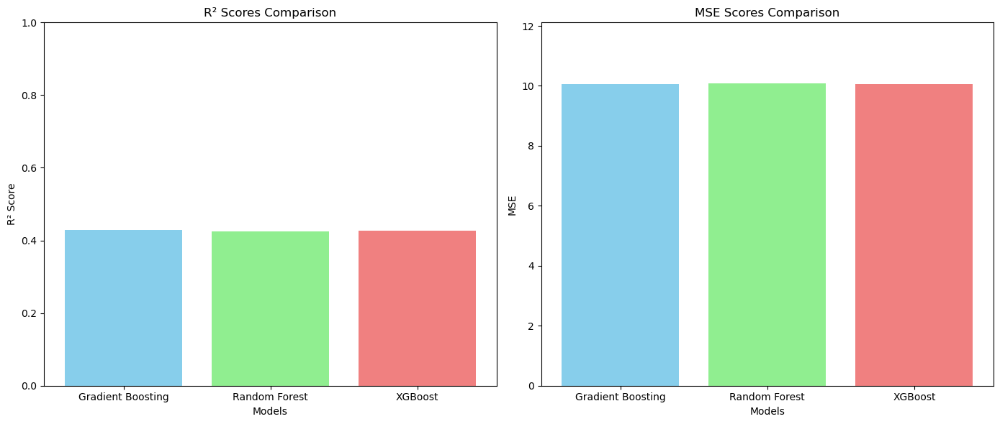

In [514]:
# Redefining the code for models to calculate R² and MSE scores for plotting

from sklearn.ensemble import GradientBoostingRegressor
from sklearn.ensemble import RandomForestRegressor
from xgboost import XGBRegressor
from sklearn.metrics import mean_squared_error, r2_score

# Train the models
gb_model = GradientBoostingRegressor(n_estimators=100, max_depth=2, random_state=0)
gb_model.fit(X_train, y_train)

with open('GradientBoostingRegressor.pkl', 'wb') as file:
    pickle.dump(gb_model, file)
y_pred_gb = gb_model.predict(X_test)
r2_score_gb = r2_score(y_test, y_pred_gb)
mse_gb = mean_squared_error(y_test, y_pred_gb)

rf_model = RandomForestRegressor(n_estimators=200, max_depth=4, random_state=0)
rf_model.fit(X_train, y_train)

with open('RandomForestRegressor2.pkl', 'wb') as file:
    pickle.dump(rf_model, file)
y_pred_rf = rf_model.predict(X_test)
r2_score_RF = r2_score(y_test, y_pred_rf)
mse_RF = mean_squared_error(y_test, y_pred_rf)

xgb_model = XGBRegressor(n_estimators=100, max_depth=2, learning_rate=0.1, random_state=0)
xgb_model.fit(X_train, y_train)

with open('XGBRegressor.pkl', 'wb') as file:
    pickle.dump(xgb_model, file)

y_pred_xgb = xgb_model.predict(X_test)
r2_score_xgb = r2_score(y_test, y_pred_xgb)
mse_xgb = mean_squared_error(y_test, y_pred_xgb)

# R² and MSE values
r2_scores = [r2_score_gb, r2_score_RF, r2_score_xgb]
mse_scores = [mse_gb, mse_RF, mse_xgb]
models = ['Gradient Boosting', 'Random Forest', 'XGBoost']

# Create a figure and set of subplots
fig, ax = plt.subplots(1, 2, figsize=(14, 6))

# Bar plot for R² scores
ax[0].bar(models, r2_scores, color=['skyblue', 'lightgreen', 'lightcoral'])
ax[0].set_title('R² Scores Comparison')
ax[0].set_xlabel('Models')
ax[0].set_ylabel('R² Score')
ax[0].set_ylim([0, 1])

# Bar plot for MSE scores
ax[1].bar(models, mse_scores, color=['skyblue', 'lightgreen', 'lightcoral'])
ax[1].set_title('MSE Scores Comparison')
ax[1].set_xlabel('Models')
ax[1].set_ylabel('MSE')
ax[1].set_ylim([0, max(mse_scores) * 1.2])

# Display the plots
plt.tight_layout()
plt.show()


## SVM model with Regression "SVR"

In [515]:
from sklearn.svm import SVR
from sklearn.metrics import r2_score
from sklearn.model_selection import cross_val_score
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt

# Step 1: Feature Scaling
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Step 2: Initialize SVR model with better parameters
svr_reg = SVR(kernel='rbf', C=100, gamma='scale', epsilon=0.01)

# Fit the model
svr_reg.fit(X_train_scaled, y_train)

with open('SVR.pkl', 'wb') as file:
    pickle.dump(svr_reg, file)

# Predictions
y_pred_train = svr_reg.predict(X_train_scaled)
y_pred_test = svr_reg.predict(X_test_scaled)

# Evaluate R² on test set
r2_test = r2_score(y_test, y_pred_test)
print('Test R² Score: {:.4f}'.format(r2_test))

# Cross-validation R² Scores
cv_r2_svr = cross_val_score(svr_reg, X_train_scaled, y_train, cv=10, scoring='r2')
print('CV R² Score: {:.4f}'.format(cv_r2_svr.mean()))

# Plot actual vs predicted for Test set
plt.figure(figsize=(8, 6))
plt.scatter(y_test, y_pred_test, color='blue', alpha=0.6)
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=2)
plt.xlabel('Actual')
plt.ylabel('Predicted')
plt.title('SVR: Actual vs Predicted after Scaling')
plt.show()


Test R² Score: 0.2491


Exception ignored in: <function WeakKeyDictionary.__init__.<locals>.remove at 0x0000025265A83A60>
Traceback (most recent call last):
  File "c:\Users\GHOST\anaconda3\Lib\weakref.py", line 370, in remove
    self = selfref()
           ^^^^^^^^^
KeyboardInterrupt: 


KeyboardInterrupt: 

## CatBoost and Lightgbm Models

In [ ]:
!pip install catboost

catboost_model R²: 0.5003
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001868 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4376
[LightGBM] [Info] Number of data points in the train set: 1745, number of used features: 30
[LightGBM] [Info] Start training from score 96.034957
lightgbm_model R²: 0.4635


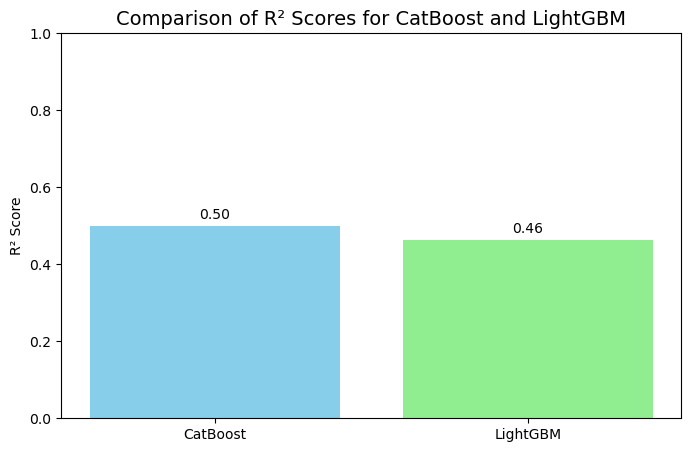

In [ ]:
from catboost import CatBoostRegressor
from lightgbm import LGBMRegressor

# CatBoost
catboost_model = CatBoostRegressor(verbose=0)
catboost_model.fit(X_train, y_train)

with open('CatBoostRegressor.pkl', 'wb') as file:
    pickle.dump(catboost_model, file)

r2_catboost = catboost_model.score(X_test, y_test)
print(f"catboost_model R²: {r2_catboost:.4f}")

# LightGBM
lightgbm_model = LGBMRegressor()
lightgbm_model.fit(X_train, y_train)

with open('LGBMRegressor.pkl', 'wb') as file:
    pickle.dump(lightgbm_model, file)
r2_lightgbm = lightgbm_model.score(X_test, y_test)
print(f"lightgbm_model R²: {r2_lightgbm:.4f}")


models = ['CatBoost', 'LightGBM']
r2_scores = [r2_catboost, r2_lightgbm]

plt.figure(figsize=(8,5))
bars = plt.bar(models, r2_scores, color=['skyblue', 'lightgreen'])

for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval + 0.01, f'{yval:.2f}', ha='center', va='bottom')

plt.title('Comparison of R² Scores for CatBoost and LightGBM', fontsize=14)
plt.ylabel('R² Score')
plt.ylim(0, 1)  # Assuming R² values are between 0 and 1
plt.show()


## Deep Neural Network

In [ ]:
!pip install scikeras

In [ ]:
!pip install -U tensorflow


  Obtaining dependency information for tensorflow from https://files.pythonhosted.org/packages/3c/e3/e868f1d5951047f950d2ba1e04a765a3328a51f06996b67976d6102f8227/tensorflow-2.19.0-cp311-cp311-win_amd64.whl.metadata
  Using cached tensorflow-2.19.0-cp311-cp311-win_amd64.whl.metadata (4.1 kB)
  Obtaining dependency information for tensorboard~=2.19.0 from https://files.pythonhosted.org/packages/5d/12/4f70e8e2ba0dbe72ea978429d8530b0333f0ed2140cc571a48802878ef99/tensorboard-2.19.0-py3-none-any.whl.metadata
  Using cached tensorboard-2.19.0-py3-none-any.whl.metadata (1.8 kB)
  Obtaining dependency information for keras>=3.5.0 from https://files.pythonhosted.org/packages/3f/0a/678ebcf4b6dad6ad63dfc2445d190f79a97fa7bc7150f57a6c505459e2bc/keras-3.9.2-py3-none-any.whl.metadata
  Using cached keras-3.9.2-py3-none-any.whl.metadata (6.1 kB)
Using cached tensorflow-2.19.0-cp311-cp311-win_amd64.whl (375.9 MB)
Using cached keras-3.9.2-py3-none-any.whl (1.3 MB)
Using cached tensorboard-2.19.0-py3-none

ERROR: Could not install packages due to an OSError: [WinError 5] Access is denied: 'C:\\Users\\GHOST\\anaconda3\\Lib\\site-packages\\tensorflow\\compiler\\mlir\\quantization\\tensorflow\\python\\pywrap_function_lib.pyd'
Consider using the `--user` option or check the permissions.



In [ ]:
from scikeras.wrappers import KerasRegressor
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout
from tensorflow.keras.optimizers import Adam
from tensorflow.keras import Input
from sklearn.model_selection import KFold, cross_val_score
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error
import numpy as np
import time

# 1. Scaling the data
scaler = MinMaxScaler()
X_train_scaled = scaler.fit_transform(X_train)

with open('MinMaxScaler.pkl', 'wb') as file:
    pickle.dump(scaler, file)

X_test_scaled = scaler.transform(X_test)

# 2. Build the Neural Network
def build_nn_model(input_dim):
    model = Sequential()
    model.add(Input(shape=(input_dim,)))
    model.add(Dense(128, activation='relu'))
    model.add(Dropout(0.2))
    model.add(Dense(64, activation='relu'))
    model.add(Dense(1))
    model.compile(optimizer=Adam(learning_rate=0.001), loss='mse')  # خففت ال learning rate شوية
    return model

# 3. Define the Keras Regressor
nn_model = KerasRegressor(
    model=build_nn_model,
    model__input_dim=X_train_scaled.shape[1],
    epochs=150,
    batch_size=32,
    verbose=0,
    random_state=0
)

# 4. Train and evaluate
print("Training Neural Network (TensorFlow)...")
start_time = time.time()

# Cross-validation
cv = KFold(n_splits=10, shuffle=True, random_state=0)
try:
      cv_scores = cross_val_score(nn_model, X_train_scaled, y_train, cv=cv, scoring='r2')
except:
    cv_scores = cross_val_score(nn_model, X_train_scaled, y_train, cv=cv, scoring='neg_mean_squared_error')

# Fit the final model
nn_model.fit(X_train_scaled, y_train)


with open('nn_model.pkl', 'wb') as file:
    pickle.dump(nn_model, file)
# Predictions
y_pred = nn_model.predict(X_test_scaled)


# Metrics
r2_NN = r2_score(y_test, y_pred)
rmse_NN = np.sqrt(mean_squared_error(y_test, y_pred))
mae_NN = mean_absolute_error(y_test, y_pred)

print(f"  Neural Network (TF) - R2: {r2_NN:.4f}, RMSE: {rmse_NN:.4f}, MAE: {mae_NN:.4f}, CV R2: {cv_scores.mean():.4f} ± {cv_scores.std():.4f}")


Training Neural Network (TensorFlow)...


AttributeError: 'super' object has no attribute '__sklearn_tags__'

# Summary of all Models " 15 Models "

In [ ]:
#creating a dataframe to compare between the accuracy of each model
model = ['LinearRegression', 'HuberRegressor','ElasticNet','Ridge', 'Lasso', 'Polynomial Regression',
         'RandomForest', 'Decision Tree', 'Gradient Boosting', 'XGBoost','CatBoost', 'LightGBM', 'SVR', 'KNN','Neural Network']
R2_Score = [
    float(mean_r2_LR) * 100,           #1
    float(r2_hyper) * 100,             #2
    float(r2_en) * 100,                #3
    float(r2_best_ridge) * 100,        #4
    float(r2_best_lasso) * 100,        #5
    float(best_r2_score) * 100,        #6
    float(r2_score_RF) * 100,          #7
    float(cv_r2_DT.mean()) * 100,      #8
    float(r2_score_gb) * 100,          #9
    float(r2_score_xgb) * 100,         #10
    float(r2_catboost) * 100,          #11
    float(r2_lightgbm) * 100,          #12
    float(cv_r2_svr.mean()) * 100,     #13
    float(best_r2) * 100,              #14
    float(r2_NN) * 100                 #15
]

The_Table = pd.DataFrame({'Model': model, 'R2_Score': R2_Score})
Sorted_Table = The_Table.sort_values(by='R2_Score', ascending=False)

Sorted_Table

,Model,R2_Score
5,Polynomial Regression,51.355023
0,LinearRegression,45.970655
2,ElasticNet,42.969285
7,Decision Tree,42.872857
1,HuberRegressor,42.777040
3,Ridge,42.768467
4,Lasso,42.731373
6,RandomForest,42.607990
9,XGBoost,42.579894
8,Gradient Boosting,42.352070


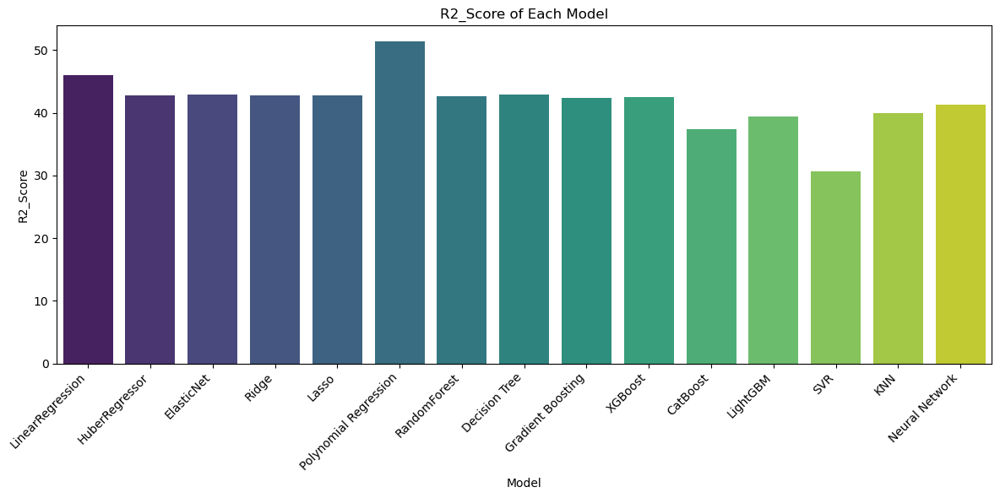

In [ ]:
#visualizing the accuracy of each model
plt.figure(figsize=(12, 6))  # Adjust the width and height as needed

# Create the barplot
sns.barplot(x='Model', y='R2_Score', data=The_Table,palette='viridis')

# Add title and labels
plt.title('R2_Score of Each Model')
plt.xlabel('Model')
plt.ylabel('R2_Score')

# Rotate x-axis labels if needed
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

In [ ]:
# Web Scrapping but need login
# ***********************************************************************************************************************************



# import time
# import re
# import imaplib
# import email
# import undetected_chromedriver as uc
# from selenium.webdriver.common.by import By
# from selenium.webdriver.support.ui import WebDriverWait
# from selenium.webdriver.support import expected_conditions as EC
# from selenium.common.exceptions import TimeoutException
# from bs4 import BeautifulSoup
# from dotenv import load_dotenv
# import os

# # Load environment variables
# load_dotenv()

# AIRBNB_EMAIL = os.getenv("AIRBNB_EMAIL")
# AIRBNB_PASSWORD = os.getenv("AIRBNB_PASSWORD")
# GMAIL_USER = os.getenv("GMAIL_USER")
# GMAIL_APP_PASSWORD = os.getenv("GMAIL_APP_PASSWORD")
# USER_IDS = [3881880]

# def fetch_airbnb_otp(gmail_user, gmail_app_password, timeout=60):
#     M = imaplib.IMAP4_SSL("imap.gmail.com")
#     M.login(gmail_user, gmail_app_password)
#     M.select("INBOX")
#     deadline = time.time() + timeout
#     otp_code = None

#     while time.time() < deadline and otp_code is None:
#         typ, msg_nums = M.search(None, '(UNSEEN FROM "notify@airbnb.com")')
#         for num in msg_nums[0].split():
#             typ, msg_data = M.fetch(num, "(RFC822)")
#             msg = email.message_from_bytes(msg_data[0][1])

#             body = ""
#             if msg.is_multipart():
#                 for part in msg.walk():
#                     if part.get_content_type() == "text/plain":
#                         body = part.get_payload(decode=True).decode(errors="ignore")
#                         break
#             else:
#                 body = msg.get_payload(decode=True).decode(errors="ignore")

#             m = re.search(r"\b(\d{6})\b", body)
#             if m:
#                 otp_code = m.group(1)
#                 break

#         if not otp_code:
#             time.sleep(5)

#     M.logout()
#     if not otp_code:
#         raise RuntimeError("Timed out fetching OTP from email")
#     return otp_code

# def login_with_selenium():
#     options = uc.ChromeOptions()
#     options.add_argument("--window-size=1920,1080")
#     options.add_argument("--disable-gpu")
#     options.add_argument("--disable-extensions")
#     options.add_argument("--no-sandbox")
#     options.add_argument("--disable-dev-shm-usage")
#     options.add_argument("--dns-prefetch-disable")

#     driver = uc.Chrome(options=options)
#     wait = WebDriverWait(driver, 60)

#     try:
#         print("Opening Airbnb login page...")
#         driver.get("https://www.airbnb.com/login")
#         time.sleep(2)

#         # Email
#         email_field = wait.until(EC.presence_of_element_located((By.NAME, "email")))
#         email_field.send_keys(AIRBNB_EMAIL)

#         continue_button = wait.until(EC.element_to_be_clickable((By.XPATH, "//button[@type='submit']")))
#         continue_button.click()
#         time.sleep(2)

#         # Password
#         password_field = wait.until(EC.element_to_be_clickable((By.NAME, "password")))
#         password_field.send_keys(AIRBNB_PASSWORD)

#         login_button = wait.until(EC.element_to_be_clickable((By.XPATH, "//button[@type='submit']")))
#         login_button.click()
#         time.sleep(5)

#         # Handle OTP
#         try:
#             otp_field = wait.until(EC.presence_of_element_located((By.XPATH, "//input[contains(@id, 'otp') or contains(@aria-label, 'code')]")))
#             print("Waiting for OTP...")
#             otp_code = fetch_airbnb_otp(GMAIL_USER, GMAIL_APP_PASSWORD)
#             otp_field.send_keys(otp_code)

#             verify_button = wait.until(EC.element_to_be_clickable((By.XPATH, "//button[@type='submit']")))
#             verify_button.click()
#             time.sleep(5)
#         except TimeoutException:
#             print("No OTP detected.")

#         if "Log in or sign up" in driver.page_source:
#             raise RuntimeError("Login failed.")

#         print("Login successful!")
#         return driver
#     except Exception as e:
#         driver.quit()
#         raise RuntimeError(f"Error during login: {str(e)}")

# def scrape_profile(driver, user_id):
#     url = f"https://www.airbnb.com/users/show/{user_id}"
#     print(f"Scraping profile: {url}")
#     driver.get(url)
#     time.sleep(3)

#     if "Log in or sign up" in driver.page_source:
#         raise RuntimeError("Not logged in!")

#     soup = BeautifulSoup(driver.page_source, "html.parser")
#     text = driver.page_source

#     name = None
#     h1 = soup.find("h1")
#     if h1:
#         name = h1.get_text(strip=True)

#     loc = None
#     m1 = re.search(r"Lives in ([A-Za-z ,]+)", text)
#     if m1:
#         loc = m1.group(1).strip()

#     joined = None
#     m2 = re.search(r"Joined in ([A-Za-z]+ \d{4}|\d{4})", text)
#     if m2:
#         joined = m2.group(1).strip()

#     reviews = []
#     for review_div in soup.find_all("div", class_=lambda c: c and ("review" in c.lower() or "comment" in c.lower())):
#         text = review_div.get_text(strip=True)
#         if text and len(text) > 10:
#             reviews.append(text)

#     return {
#         "user_id": user_id,
#         "name": name,
#         "location": loc,
#         "joined": joined,
#         "host_reviews": reviews
#     }

# def main():
#     try:
#         driver = login_with_selenium()
#         data = []
#         for uid in USER_IDS:
#             profile = scrape_profile(driver, uid)
#             data.append(profile)
#             time.sleep(2)

#         from pprint import pprint
#         pprint(data)

#     except Exception as e:
#         print(f"Error: {str(e)}")
#     finally:
#         if 'driver' in locals():
#             driver.quit()

# if __name__ == "__main__":
#     main()




# **************************************************************************************************************************



In [ ]:
# Define the columns to include in X_train
selected_columns = [
    'number_of_reviews',
    'host_total_listings_count',
    'minimum_nights',
    'maximum_nights',
    'guests_included',
    'bedrooms',
    'bathrooms',
    'host_response_rate',
    'price_per_stay',
    'nightly_price'
]

# Filter the dataset to include only the selected columns
X = df.drop(columns=[target_col])
X_best = X[selected_columns]
X_scaled = scaler.fit_transform(X_best)
y=df[target_col]
# Ensure the target column is defined # Replace 'target_col' with the actual target column name
X_train, X_test, y_train, y_test = train_test_split(
    X_scaled, y, test_size=0.2, random_state=RANDOM_STATE
)
# Perform train-test split
X_train.shape




# Random Forest
def build_nn_model(input_dim):
    model = Sequential()
    model.add(Input(shape=(input_dim,)))
    model.add(Dense(128, activation='relu'))
    model.add(Dropout(0.2))
    model.add(Dense(64, activation='relu'))
    model.add(Dense(1))
    model.compile(optimizer=Adam(learning_rate=0.01), loss='mse')
    return model

nn_model = KerasRegressor(
    model=build_nn_model,
    model__input_dim=X_train.shape[1],
    epochs=100,
    batch_size=32,
    verbose=0,
    random_state=RANDOM_STATE
)
nn_model.fit(X_train, y_train)


lin_reg = LinearRegression()
lin_reg.fit(X_train, y_train)

reg = DecisionTreeRegressor(criterion='squared_error', max_depth=4, random_state=0)
reg.fit(X_train, y_train)
rf_model = RandomForestRegressor(n_estimators=200, max_depth=4, random_state=0)
rf_model.fit(X_train, y_train)


import joblib
file='dc'
joblib.dump(reg,"dc")
file='lin_reg'
joblib.dump(lin_reg,"lin_reg")
file='rf_model'
joblib.dump(rf_model,"rf_model")

X_train.head()

AttributeError: 'numpy.ndarray' object has no attribute 'head'

In [ ]:
!zip pkl_files2.zip *.pkl
from google.colab import files
files.download('pkl_files2.zip')

  adding: best_DT_model.pkl (deflated 58%)
  adding: CatBoostRegressor.pkl (deflated 61%)
  adding: clusterScaled.pkl (deflated 29%)
  adding: DecisionTreeRegressor.pkl (deflated 54%)
  adding: elastic_net_model.pkl (deflated 36%)
  adding: GradientBoostingRegressor.pkl (deflated 73%)
  adding: host_name_target_means.pkl (deflated 62%)
  adding: huberModel1.pkl (deflated 73%)
  adding: HuberModel2.pkl (deflated 76%)
  adding: huberModel.pkl (deflated 73%)
  adding: kmeanForHostCluster.pkl (deflated 88%)
  adding: LabelEncoder_for_host_is_superhost.pkl (deflated 10%)
  adding: LGBMRegressor.pkl (deflated 64%)
  adding: linearLogTransformation.pkl (deflated 32%)
  adding: LinearOriginal.pkl (deflated 32%)
  adding: linearRegression.pkl (deflated 32%)
  adding: Log Transform.pkl (deflated 31%)
  adding: lowerUpperOutliersForPickle.pkl (deflated 52%)
  adding: MinMaxScaler.pkl (deflated 44%)
  adding: modesToReplaceNulls.pkl (deflated 58%)
  adding: Polynomial.pkl (deflated 16%)
  adding: 

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>